In [1]:
##############
### Import ###
##############

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

from scipy.optimize import curve_fit

#Astropy
import astropy
from astropy.io import fits
from astropy.table import Table

# Matplotlib
import matplotlib
import matplotlib.pyplot as plt
# %matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

#Numpy/Scipy
import numpy as np
from scipy.interpolate import InterpolatedUnivariateSpline as IUS

import numpy as np
import astropy
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm_notebook

In [2]:
def salarisfeh(feh,al):
    '''
    Calculate the Salaris corrected from Salaris et al. 1993
    
    Inputs:
    ------
        feh: [Fe/H]
        al: [alpha/Fe]
    
    Output:
    ------
        salfeh: Salaris Corrected [Fe/H]
    '''
    
    salfeh = feh+np.log10(0.638*(10**(al))+0.362)
    return salfeh

leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
def ccm_a(x):
    '''
    a(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        a: a function value  
    '''
    if 0.3 <= x < 1.1:
        a = 0.574*(x**1.61)
        return a
    
    elif 1.1 <= x < 3.3:
        y = x - 1.82
        a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
        return a
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
            return a
        
        else:
            fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
            return a       
    
def ccm_b(x):
    '''
    b(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        b: b function value 
    '''
    if 0.3 <= x < 1.1:
        b = -0.527*(x**1.61)
        return b
    
    elif 1.1 <= x <= 3.3:
        y = x - 1.82
        b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
        return b
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
            return b
        
        else:
            fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
            return b
    
def ccm_alav(wave,rv):
    '''
    Calculate A\lambda/Av
    
    Inputs:
    ------
        wave: effective wavelength in units of micron
        rv: Rv value (=Av/E(B_V))
        
    Output:
    ------
        alav: A\lambda/Av
    '''
    x=1/wave
    alav = ccm_a(x)+ccm_b(x)/rv
    return alav

ejk_ak = (ccm_alav(leff['J'],3.1)-ccm_alav(leff['K'],3.1))/ccm_alav(leff['K'],3.1)
ebv_ak = (ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))/ccm_alav(leff['K'],3.1)

def closest(data,value):
    '''
    Find nearest value in array to given value
        
    Inputs:
    ------
        data: data to search through 
        value: value of interest
    '''
        
    data = np.asarray(data)
    return data[(np.abs(np.subtract(data,value))).argmin()]

def mad(dat):
    return np.nanmedian(np.abs(dat-np.nanmedian(dat)))

abp_ebv = ccm_alav(leff['BP'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
arp_ebv = ccm_alav(leff['RP'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
aj_ebv = ccm_alav(leff['J'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
ah_ebv = ccm_alav(leff['H'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))
ak_ebv = ccm_alav(leff['K'],3.1)/(ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))

# PARSEC

In [3]:
massive = fits.getdata('/Users/joshuapovick/Desktop/Research/parsec/parsec_massive_3_5.fits.gz')
massive = Table(massive[np.where(massive['label']==3.0)])
massive['index'] = np.arange(len(massive))
massive = massive[np.argsort(massive['logAge'])]
massive = massive['index','MH','logAge','logTe','logg','Gmag','G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']

# APOKASC

In [4]:
# APOKASC
from astropy.io import ascii
kasc = fits.getdata('/Users/joshuapovick/Desktop/Research/APOKASC/APOKASC_cat_v6.7.2.fits.gz')
kasc3 = ascii.read('MLtesterr3bDR16A3PalphaM_july5.out')

### xmatch DR17
dr17 = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStarLite-dr17-synspec.fits.gz')
_, kasc_ind, dr17_ind = np.intersect1d(kasc['2MASS_ID'],dr17['APOGEE_ID'], return_indices=True)

kascdr17 = dr17[dr17_ind]
kasc = kasc[kasc_ind]

### xmatch kasc2 and kasc3
_, kasc3_ind, kasc_ind = np.intersect1d(kasc3['2MASSID'],kasc['2MASS_ID'], return_indices=True)

kasc = kasc[kasc_ind]
kasc3dr17 = kascdr17[kasc_ind]
kasc3 = kasc3[kasc3_ind]

In [5]:
ageevs = np.where((kasc3['IntAge']>-10.)&(kasc['APOKASC3_CONS_EVSTATES']==1.0)&
                  (kasc3dr17['FE_H']<=0.0)&
                  (kasc3dr17['GAIAEDR3_PARALLAX']/kasc3dr17['GAIAEDR3_PARALLAX_ERROR']>3.0))

kasc3dr17 = kasc3dr17[ageevs]
kasc3 = kasc3[ageevs]

In [14]:
ages = Table(fits.getdata('APOKASC_rgb_SalarisCNAlpha.fits'))
ages.columns

<TableColumns names=('NAME','AGE','AGE_ERR','AK','AK_ERR')>

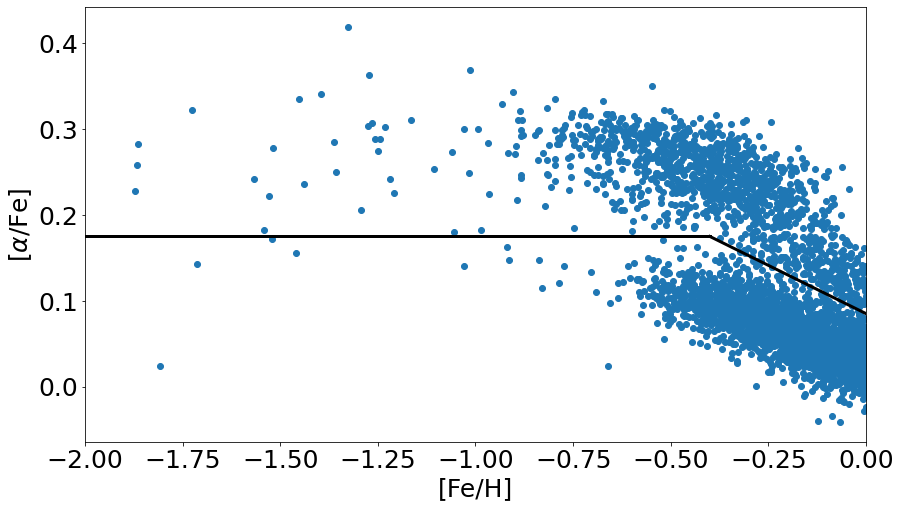

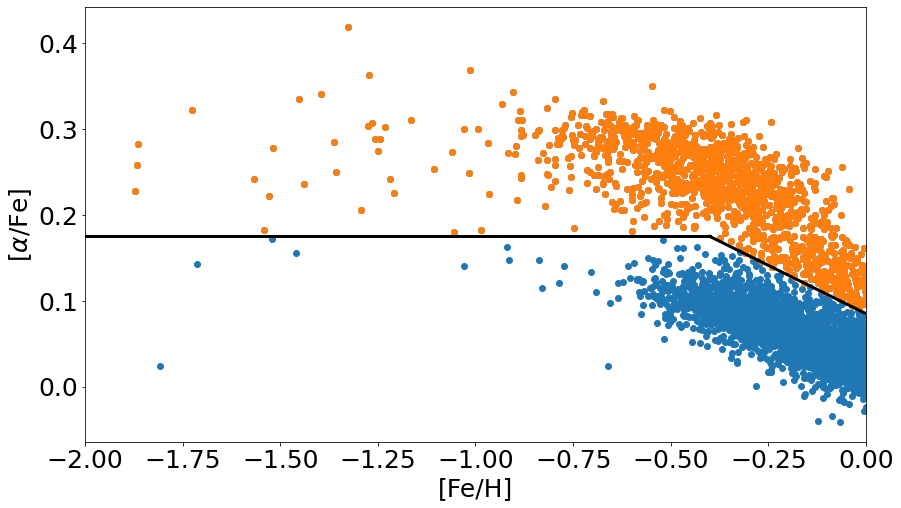

In [15]:
plt.figure(figsize=[14,8])
plt.scatter(kasc3dr17['FE_H'],(kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H']))

plt.plot([-2.,-0.4],[0.175,0.175],c='k',lw=3.)
plt.plot([-0.4,0.0],[0.175,0.085],c='k',lw=3.)
plt.xlim(-2.0,0.0)

plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[$\alpha$/Fe]')
plt.show()

def alphaboundary(feh):
    '''
    Boundary between high alpha and low alpha
    
    (x0,y0): (-0.4,0.175), (x1,y1): (0.0,0.085)
    
    Input:
    -----
        feh: [Fe/H]
    
    Output:
    ------
        ups: value on boundary
    '''
    ups = np.ones(np.size(feh))
    for i in range(np.size(feh)):
        if feh[i] <= -0.4:
            up = 0.175
        else:
            up = ((0.085-0.175)/(0.0--0.4))*(feh[i]--0.4)+0.175
            
        ups[i] = up
    return ups

higha = np.where((kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H'])-alphaboundary(kasc3dr17['FE_H'])>0.0)
lowa = np.where((kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H'])-alphaboundary(kasc3dr17['FE_H'])<0.0)

plt.figure(figsize=[14,8])
plt.scatter(kasc3dr17['FE_H'],(kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H']))
plt.scatter(kasc3dr17['FE_H'][higha],(kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H'])[higha])

plt.plot([-2.,-0.4],[0.175,0.175],c='k',lw=3.)
plt.plot([-0.4,0.0],[0.175,0.085],c='k',lw=3.)
plt.xlim(-2.0,0.0)

plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[$\alpha$/Fe]')
plt.show()

# Gaia Error

In [16]:
from scipy.stats import binned_statistic
gaiaedr3 = fits.getdata('/Users/joshuapovick/Desktop/Research/gaia/GAIAEDR3allStar.fits.gz')

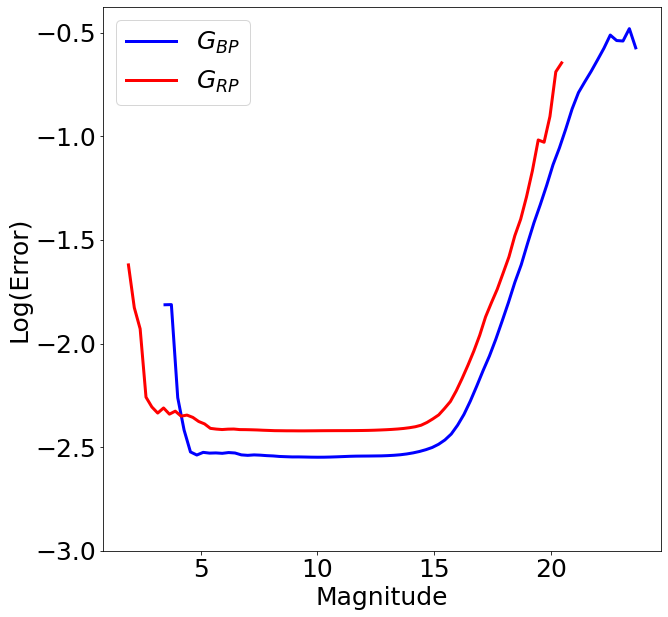

In [17]:
binnum = 75

### BP
bp_fin = np.where(np.isfinite(gaiaedr3['phot_bp_mean_mag'])==True)

bpmin = min(gaiaedr3['phot_bp_mean_mag'][bp_fin])
bpmax = max(gaiaedr3['phot_bp_mean_mag'][bp_fin])

bpdiff = bpmax-bpmin
bpfluxerr = (2.5*0.434)/gaiaedr3['phot_bp_mean_flux_over_error'][bp_fin]
bpmagerr = np.sqrt((bpfluxerr)**2+0.0027901700**2)

bpbin ,_,_ = binned_statistic(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),'median',bins=binnum)

### RP 
rp_fin = np.where(np.isfinite(gaiaedr3['phot_rp_mean_mag'])==True)

rpmin = min(gaiaedr3['phot_rp_mean_mag'][rp_fin])
rpmax = max(gaiaedr3['phot_rp_mean_mag'][rp_fin])

rpdiff = rpmax-rpmin
rpfluxerr = (2.5*0.434)/gaiaedr3['phot_rp_mean_flux_over_error'][rp_fin]
rpmagerr = np.sqrt((rpfluxerr)**2+0.0037793818**2)

rpbin ,_,_ = binned_statistic(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),'median',bins=binnum)

### Plot
plt.figure(figsize=[10,10])
plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
plt.legend()
plt.ylim(bottom=-3.0)
plt.xlabel('Magnitude')
plt.ylabel('Log(Error)');

bperrfunc = IUS(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin)
rperrfunc = IUS(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin)

bperr = 10**bperrfunc(kasc3dr17['GAIAEDR3_PHOT_BP_MEAN_MAG'])
rperr = 10**rperrfunc(kasc3dr17['GAIAEDR3_PHOT_RP_MEAN_MAG'])

In [18]:
def salariscna(abund,abunderr=None):
    '''
    Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
    Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
    Inputs:
    ------
    abund: [4x2 array] first column is [Fe/H],[C/Fe],[N/Fe],[alpha/Fe]
       and second column is the errors
        
    Output:
    ------
    calc_salfeh: Salaris corrected metallicity
    calc_salfeh_err: error in corrected metallicity
    '''
        
    ### Salaris coefficients
    # (atomic_wgts/hydrogen_wgt) = (C,N,O,Mg,Si,S,Ca,Ti)/H
    #asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
    #mass_ratio = np.array([12.011,14.007,15.999,24.305,28.085,32.06,40.078,47.867])/1.008 #IUPAC
    # with Ne
    # (atomic_wgts/hydrogen_wgt) = (C,N,O,Ne,Mg,Si,S,Ca,Ti)/H    
    asplund = np.array([8.43,7.83,8.69,7.93,7.60,7.51,7.12,6.34,4.95])
    mass_ratio = np.array([12.011,14.007,15.999,20.1797,24.305,28.085,32.06,40.078,47.867])/1.008 #IUPAC    
    ZX_sol = 0.0181 # (Z/X) Asplund et al. 2009
    XZ_k = np.multiply(10**(asplund-12.0),mass_ratio/ZX_sol)
    sal_a = np.sum(XZ_k)
    sal_b = 1 - sal_a
        
    ### Alpha+C+N
    #wgts = asplund/np.sum(asplund)
    # add together the alpha weights
    wgts = np.array([asplund[0],asplund[1],np.sum(asplund[2:])])/np.sum(asplund)
    
    feh = abund[0]
    cnalpha = abund[1:]
    
    #cnafe = np.log10(np.sum((10**cnalpha)*wgts)))
    #salfeh = feh + np.log10(sal_a*10**(cnafe)+sal_b)

    cnafe = np.sum((10**cnalpha)*wgts)
    salfeh = feh + np.log10(sal_a*cnafe+sal_b)        
    
    # Uncertainties
    if abunderr is not None:
        feherr = abunderr[0]
        cnafe_err = np.sqrt(np.sum((10**abund[1:]*np.log(10)*abunderr[1:]*wgts)**2))
        corr_err = cnafe_err/((sal_a*cnafe*sal_b)*np.log(10))
        salfeherr = np.sqrt(feherr**2+corr_err**2)

        return salfeh, salfeherr
    
    else:
        return salfeh


In [19]:
def giantsjkteff(jk,feh):
    '''
    Calculate the photomteric Teff using Gonz\'{a}lez Hern\'{a}ndez & Bonifacio 2009 using the J-K color
    
    Inputs:
    ------
        jk: J-K color of a star
        feh: metallicity of a star
    
    Output:
    ------
        calcteff: calculated Teff for star
    '''
    
    theta = 0.6517+(0.6312*jk)+0.0168*(jk**2)-0.0381*(jk*feh)+0.0256*feh+0.0013*(feh**2)
    calcteff = 5040/theta # +/- 94 K 
    
    return calcteff

In [20]:
ejk_ak = (ccm_alav(leff['J'],3.1)-ccm_alav(leff['K'],3.1))/ccm_alav(leff['K'],3.1)
photteff = np.ones(len(kasc3dr17))
for i in range(len(kasc3dr17)):
    photteff[i] = giantsjkteff((kasc3dr17['J']-kasc3dr17['K'])[i]-ages['AK'][i]*ejk_ak,kasc3dr17['FE_H'][i])


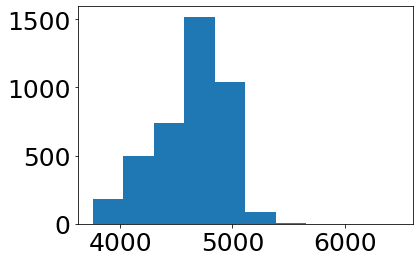

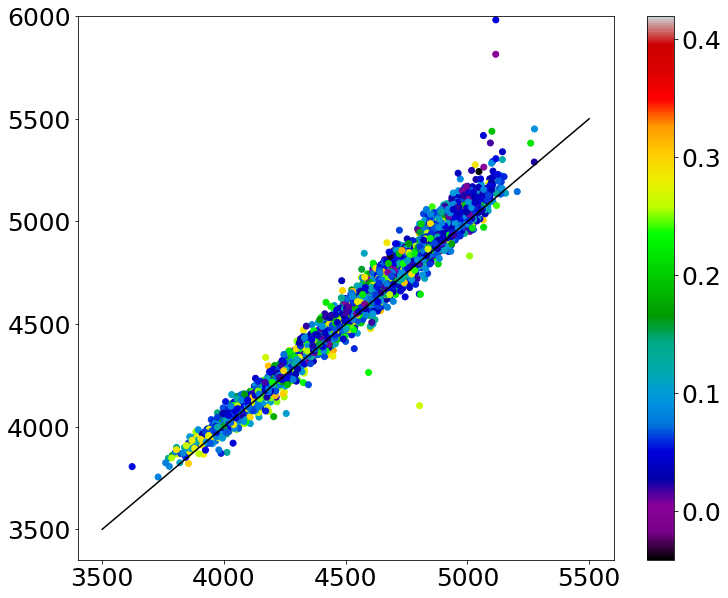

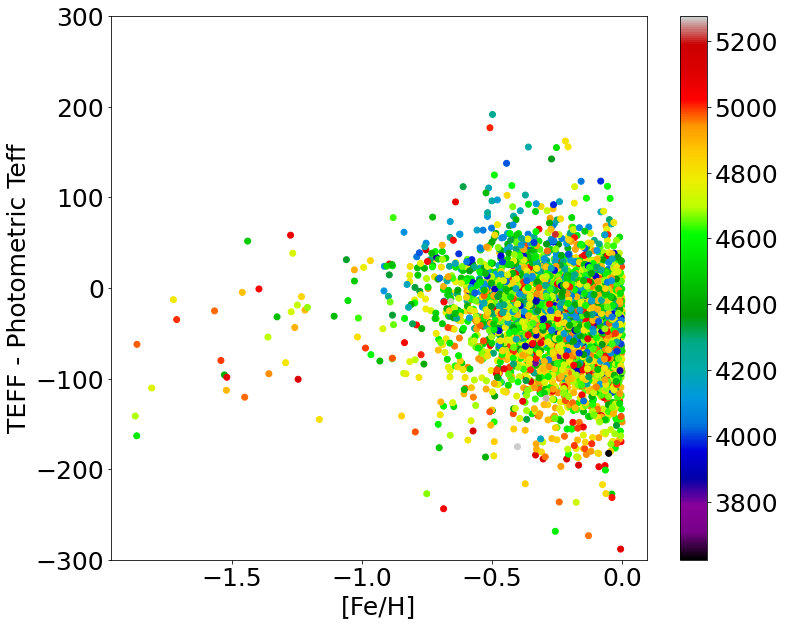

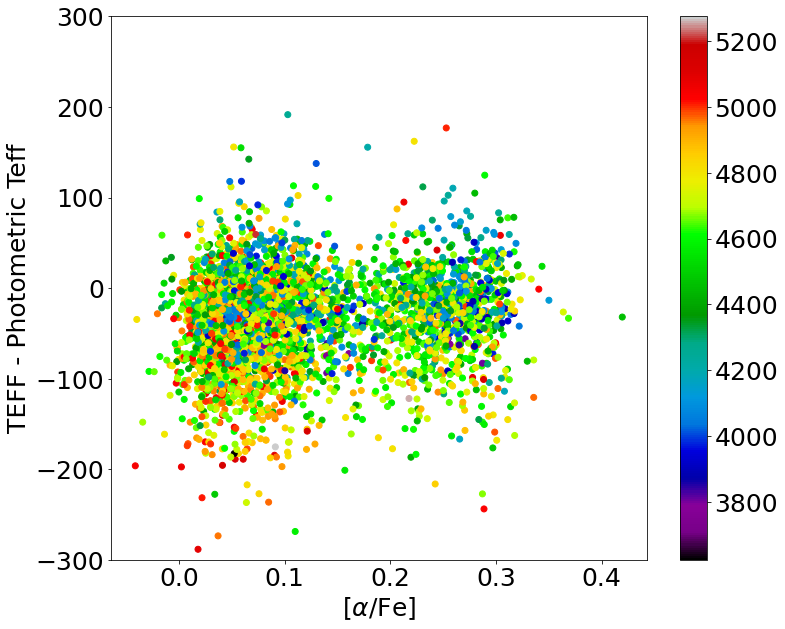

In [21]:
plt.hist(photteff)
plt.show()

apoafe = kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H']
plt.figure(figsize=[12,10])
plt.scatter(kasc3dr17['TEFF'],photteff,c=apoafe,cmap='nipy_spectral')
plt.colorbar()
plt.plot([3500,5500],[3500,5500],c='k')
plt.ylim(top=6000)
plt.show()

plt.figure(figsize=[12,10])
plt.scatter(kasc3dr17['FE_H'],kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='nipy_spectral')
plt.colorbar()
plt.ylim(-300,300)
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'TEFF - Photometric Teff')
plt.show()


plt.figure(figsize=[12,10])
plt.scatter(apoafe,kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='nipy_spectral')
plt.colorbar()
plt.ylim(-300,300)
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'TEFF - Photometric Teff')
plt.show()

In [22]:
sal = 999999.0*np.ones(len(kasc3dr17))
salerr = 999999.0*np.ones(len(kasc3dr17))

apoafe = kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H']
apoafeerr = np.sqrt(kasc3dr17['ALPHA_M_ERR']**2+kasc3dr17['M_H_ERR']**2+kasc3dr17['FE_H_ERR']**2)

for i in tqdm_notebook(range(len(kasc3dr17))):
    ab = np.array([kasc3dr17['FE_H'][i],kasc3dr17['C_FE'][i],kasc3dr17['N_FE'][i],apoafe[i]])
    aberr = np.array([kasc3dr17['FE_H_ERR'][i],kasc3dr17['C_FE_ERR'][i],kasc3dr17['N_FE_ERR'][i],apoafeerr[i]])
    sal[i],salerr[i] = salariscna(ab,aberr)

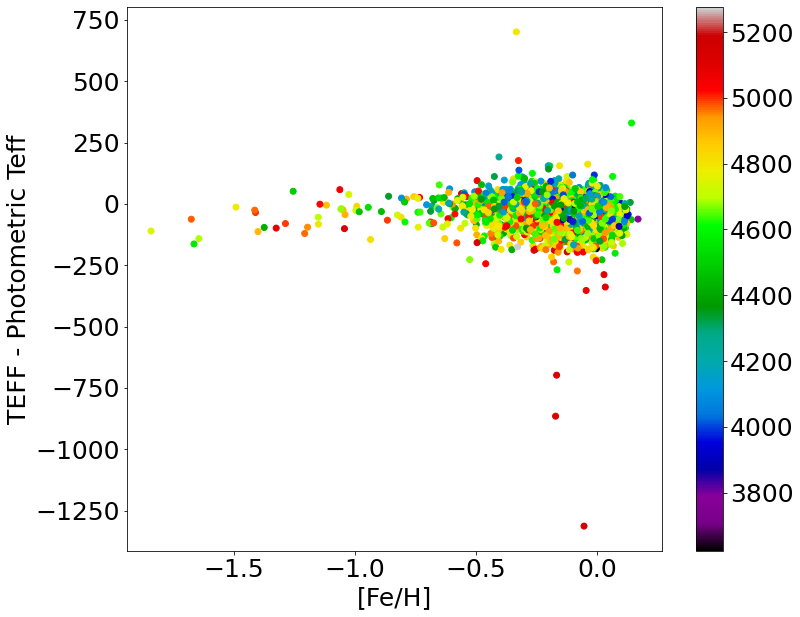

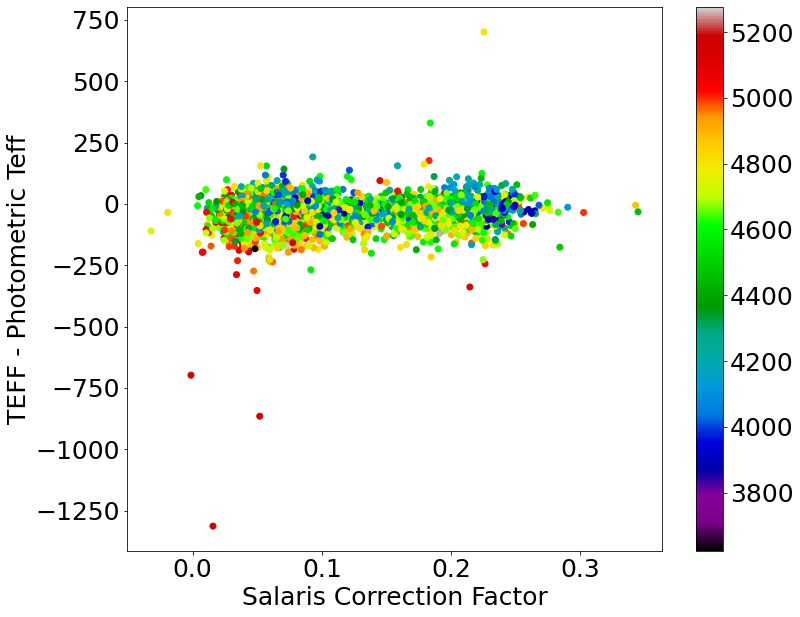

In [23]:
plt.figure(figsize=[12,10])
plt.scatter(sal,kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='nipy_spectral')
plt.colorbar()
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'TEFF - Photometric Teff')
plt.show()

plt.figure(figsize=[12,10])
plt.scatter(sal-kasc3dr17['FE_H'],kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='nipy_spectral')
plt.colorbar()
plt.xlabel(r'Salaris Correction Factor')
plt.ylabel(r'TEFF - Photometric Teff')
plt.show()

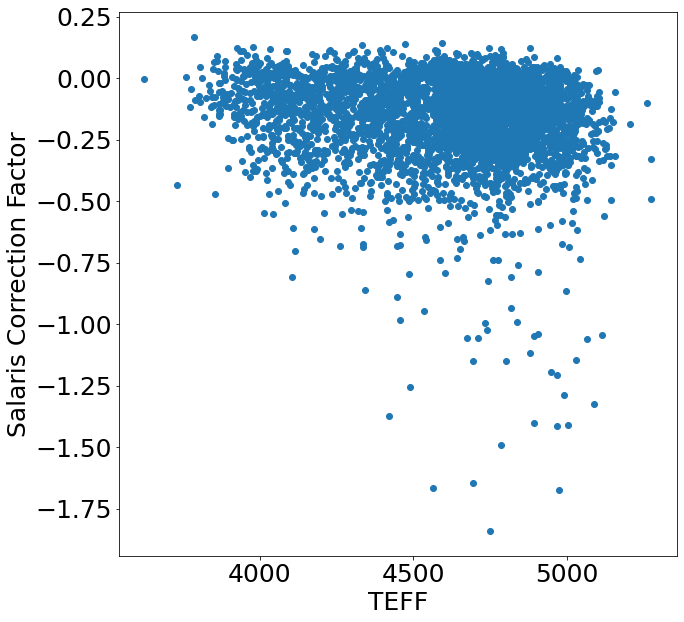

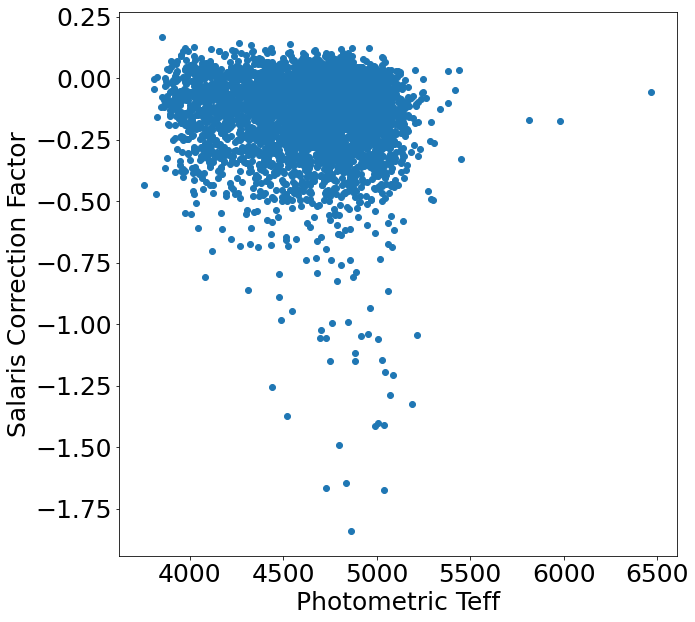

In [24]:
plt.figure(figsize=[10,10])
plt.scatter(kasc3dr17['TEFF'],sal,cmap='nipy_spectral')
# plt.colorbar()
plt.ylabel(r'Salaris Correction Factor')
plt.xlabel(r'TEFF')
plt.show()

plt.figure(figsize=[10,10])
plt.scatter(photteff,sal,cmap='nipy_spectral')
# plt.colorbar()
plt.ylabel(r'Salaris Correction Factor')
plt.xlabel(r'Photometric Teff')
plt.show()

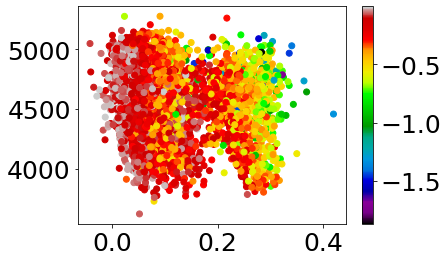

In [25]:
plt.scatter(apoafe,kasc3dr17['TEFF'],c=kasc3dr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()

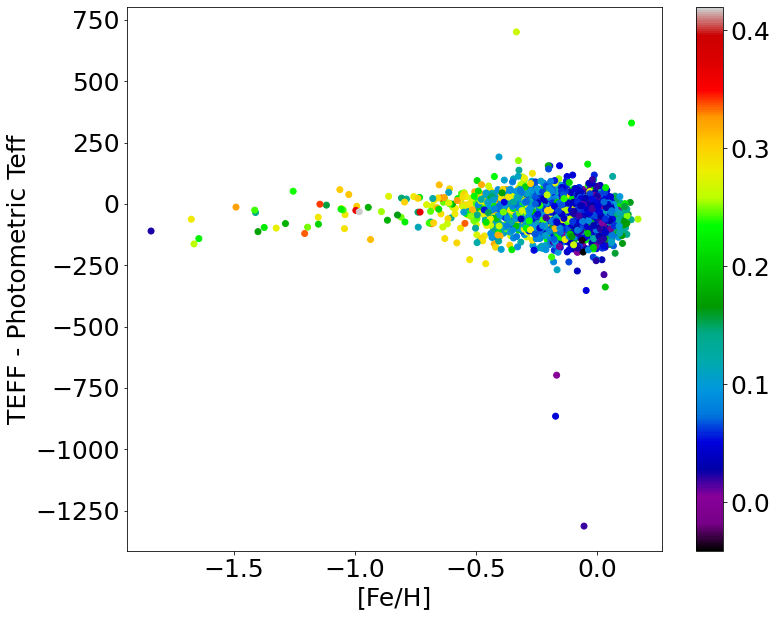

In [26]:
plt.figure(figsize=[12,10])
plt.scatter(sal,kasc3dr17['TEFF']-photteff,c=apoafe,cmap='nipy_spectral')
plt.colorbar()
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'TEFF - Photometric Teff')
plt.show()

(array([   5.,  296., 1223., 1241.,  533.,  335.,  293.,   93.,   32.,
           6.]),
 array([0.38300037, 0.4783004 , 0.5736004 , 0.6689004 , 0.7642004 ,
        0.8595004 , 0.9548004 , 1.0501004 , 1.1454004 , 1.2407005 ,
        1.3360004 ], dtype=float32),
 <a list of 10 Patch objects>)

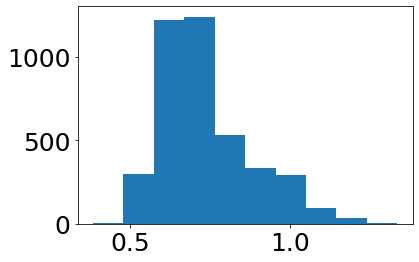

In [27]:
plt.hist(kasc3dr17['J']-kasc3dr17['K'])

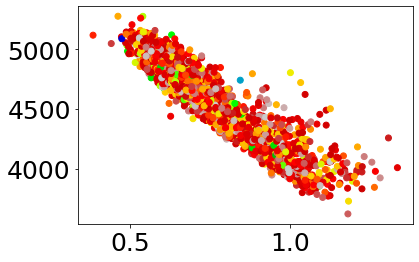

In [28]:
plt.scatter(kasc3dr17['J']-kasc3dr17['K'],kasc3dr17['TEFF'],c=kasc3dr17['FE_H'],cmap='nipy_spectral')

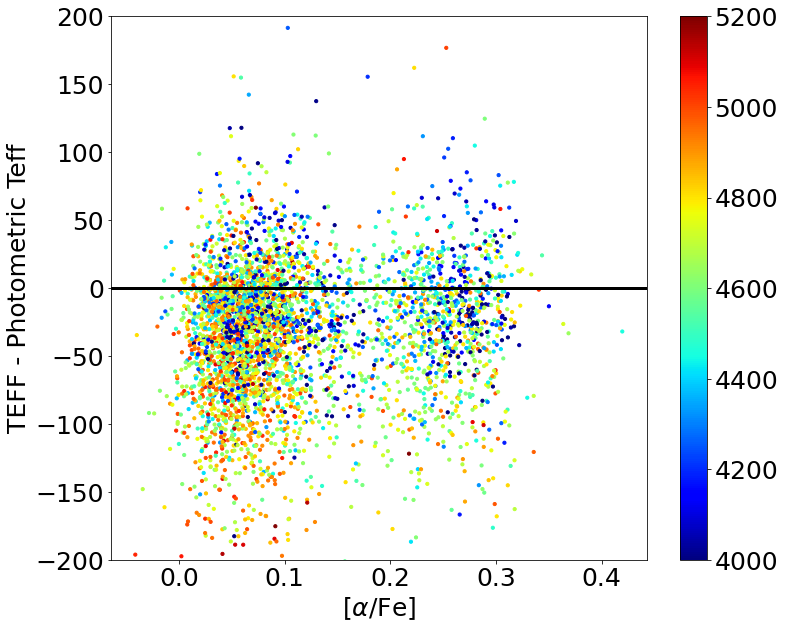

In [29]:
plt.figure(figsize=[12,10])
plt.scatter(apoafe,kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='jet',vmin=4000,vmax=5200,s=10)
plt.colorbar()
plt.axhline(0.,c='k',lw=3)
plt.ylim(-200,200)
# plt.title(r'Median Residual: {:.3f}'.format(np.nanmedian(kasc3dr17['TEFF']-photteff)))
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'TEFF - Photometric Teff')
plt.savefig('../plots/afe_teffresid_teff_original.pdf')
plt.show()

In [30]:
def alphaboundary(feh):
    '''
    Boundary between high alpha and low alpha
    
    (x0,y0): (-0.4,0.175), (x1,y1): (0.0,0.085)
    
    Input:
    -----
        feh: [Fe/H]
    
    Output:
    ------
        ups: value on boundary
    '''
    ups = np.ones(np.size(feh))
    for i in range(np.size(feh)):
        if feh[i] <= -0.4:
            up = 0.175
        else:
            up = ((0.085-0.175)/(0.0--0.4))*(feh[i]--0.4)+0.175
            
        ups[i] = up
    return ups

higha = np.where((kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H'])[badcut]-
                 alphaboundary(kasc3dr17['FE_H'][badcut])>0.0)
lowa = np.where((kasc3dr17['ALPHA_M']+kasc3dr17['M_H']-kasc3dr17['FE_H'])[badcut]-
                 alphaboundary(kasc3dr17['FE_H'][badcut])<0.0)

NameError: name 'badcut' is not defined

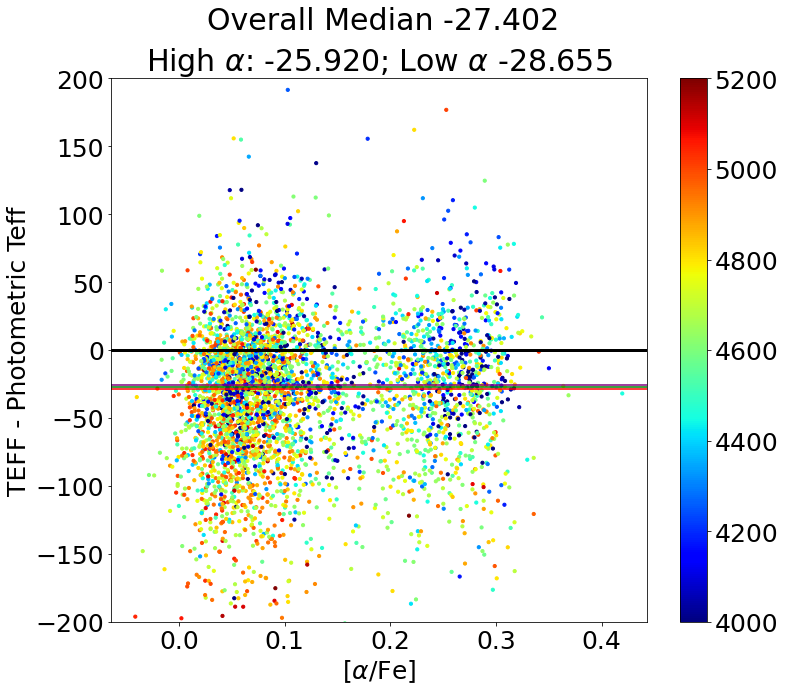

In [31]:
plt.figure(figsize=[12,10])
plt.scatter(apoafe,kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='jet',vmin=4000,vmax=5200,s=10)
plt.colorbar()
plt.axhline(0.,c='k',lw=3)
plt.axhline(np.nanmedian(kasc3dr17['TEFF']-photteff),c='green')
plt.axhline(np.nanmedian((kasc3dr17['TEFF']-photteff)[higha]),c='purple')
plt.axhline(np.nanmedian((kasc3dr17['TEFF']-photteff)[lowa]),c='red')
plt.ylim(-200,200)
# plt.title(r'Median Residual: {:.3f}'.format(np.nanmedian(kasc3dr17['TEFF']-photteff)))
plt.title(r'High $\alpha$: {:.3f}; Low $\alpha$ {:.3f}'.format(
    np.nanmedian((kasc3dr17['TEFF']-photteff)[higha]),np.nanmedian((kasc3dr17['TEFF']-photteff)[lowa])))
plt.suptitle(r'Overall Median {:.3f}'.format(np.nanmedian(kasc3dr17['TEFF']-photteff)),x=0.44)
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'TEFF - Photometric Teff')
plt.savefig('../plots/afe_teffresid_teff.pdf',bbox_inches='tight',dpi=300)
plt.show()

NameError: name 'upturn10Gyr' is not defined

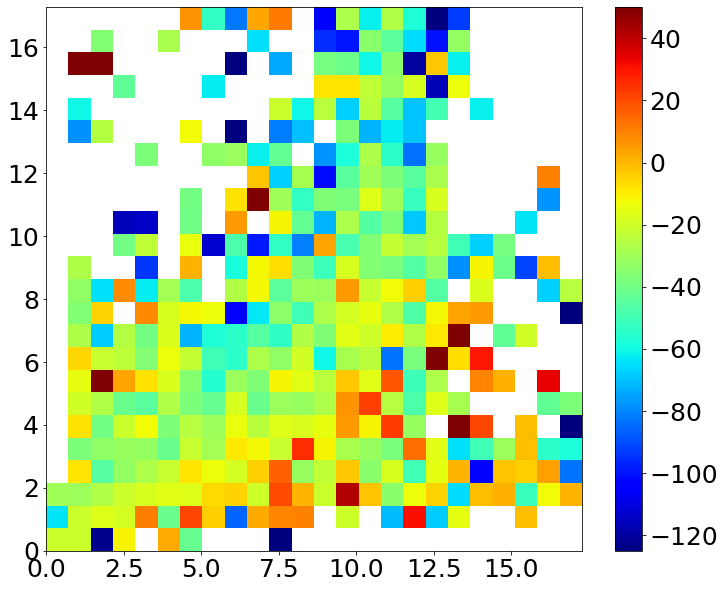

In [32]:
from scipy.stats import binned_statistic_2d

badcut = np.where(ages['AGE']<999999.0)
x = kasc3['IntAge'][badcut]
y = ages['AGE'][badcut]

xmax = 18
ymax = 18
nbins = 25

ret = binned_statistic_2d(x,y,(kasc3dr17['TEFF']-photteff)[badcut],'median',
                          bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)])

plt.figure(figsize=[12,10])
plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='jet',vmin=-125,vmax=50)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.savefig('../plots/age_age_teffresid.pdf',bbox_inches='tight',dpi=300)
plt.show()

#### Scatterplot Version ####
plt.figure(figsize=[12,10])

plt.scatter(x,y,c=(kasc3dr17['TEFF']-photteff)[badcut],cmap='jet',vmin=-125,vmax=50)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xlabel(r'')
plt.ylabel(r'')


plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.savefig('../plots/age_age_teffresid_scatter.pdf',bbox_inches='tight',dpi=300)
plt.show()

In [ ]:
# ### 4000 - 4200
# cut4042 = np.where((kasc3dr17['TEFF']>=4000)&(kasc3dr17['TEFF']<4200)&
#                    (np.isfinite(kasc3dr17['TEFF']-photteff)==True))
# resmed4042,resedg4042,_ = binned_statistic(apoafe[cut4042],(kasc3dr17['TEFF']-photteff)[cut4042],
#                                            statistic='median',bins=20)

# ### 4200 - 4400
# cut4244 = np.where((kasc3dr17['TEFF']>=4200)&(kasc3dr17['TEFF']<4400)&
#                    (np.isfinite(kasc3dr17['TEFF']-photteff)==True))
# resmed4244,resedg4244,_ = binned_statistic(apoafe[cut4244],(kasc3dr17['TEFF']-photteff)[cut4244],
#                                            statistic='median',bins=20)

# ### 4400 - 4600
# cut4446 = np.where((kasc3dr17['TEFF']>=4400)&(kasc3dr17['TEFF']<4600)&
#                    (np.isfinite(kasc3dr17['TEFF']-photteff)==True))
# resmed4446,resedg4446,_ = binned_statistic(apoafe[cut4446],(kasc3dr17['TEFF']-photteff)[cut4446],
#                                            statistic='median',bins=20)

# ### 4600 - 4800
# cut4648 = np.where((kasc3dr17['TEFF']>=4600)&(kasc3dr17['TEFF']<4800)&
#                    (np.isfinite(kasc3dr17['TEFF']-photteff)==True))
# resmed4648,resedg4648,_ = binned_statistic(apoafe[cut4648],(kasc3dr17['TEFF']-photteff)[cut4648],
#                                            statistic='median',bins=20)

# ### 4800 - 5000
# cut4850 = np.where((kasc3dr17['TEFF']>=4800)&(kasc3dr17['TEFF']<5000)&
#                    (np.isfinite(kasc3dr17['TEFF']-photteff)==True))
# resmed4850,resedg4850,_ = binned_statistic(apoafe[cut4850],(kasc3dr17['TEFF']-photteff)[cut4850],
#                                            statistic='median',bins=20)

# ### 5000 - 5200
# cut5052 = np.where((kasc3dr17['TEFF']>=5000)&(kasc3dr17['TEFF']<5200)&
#                    (np.isfinite(kasc3dr17['TEFF']-photteff)==True))
# resmed5052,resedg5052,_ = binned_statistic(apoafe[cut5052],(kasc3dr17['TEFF']-photteff)[cut5052],
#                                            statistic='median',bins=10)

# plt.figure(figsize=[24,20])
# # plt.scatter(apoafe,kasc3dr17['TEFF']-photteff)#,c=kasc3dr17['TEFF'],cmap='nipy_spectral',vmin=4000)
# # plt.colorbar()
# plt.axhline(0.,c='k',lw=3)
# plt.plot((resedg4042[:-1]+resedg4042[1:])/2,resmed4042,c='purple',lw=5,label='4000-4200')
# plt.plot((resedg4244[:-1]+resedg4244[1:])/2,resmed4244,c='blue',lw=5,label='4200-4400')
# plt.plot((resedg4446[:-1]+resedg4446[1:])/2,resmed4446,c='turquoise',lw=5,label='4400-4600')
# plt.plot((resedg4648[:-1]+resedg4648[1:])/2,resmed4648,c='green',lw=5,label='4600-4800')
# plt.plot((resedg4850[:-1]+resedg4850[1:])/2,resmed4850,c='orange',lw=5,label='4800-5000')
# plt.plot((resedg5052[:-1]+resedg5052[1:])/2,resmed5052,c='red',lw=5,label='5000-5200')
# plt.legend()
# plt.ylim(-150,150)
# plt.xlabel(r'[$\alpha$/Fe]')
# plt.ylabel(r'TEFF - Photometric Teff')
# plt.savefig('../plots/afe_teffresid.pdf',bbox_inches='tight',dpi=300)
# plt.show()

In [33]:
# p4042 = np.poly1d(np.polyfit((resedg4042[:-1]+resedg4042[1:])/2,resmed4042,1))
# p4244 = np.poly1d(np.polyfit((resedg4244[:-1]+resedg4244[1:])/2,resmed4244,1))
# fin4446 = np.where(np.isfinite(resmed4446)==True)
# p4446 = np.poly1d(np.polyfit(((resedg4446[:-1]+resedg4446[1:])/2)[fin4446],resmed4446[fin4446],1))
# p4648 = np.poly1d(np.polyfit((resedg4648[:-1]+resedg4648[1:])/2,resmed4648,1))
# p4850 = np.poly1d(np.polyfit((resedg4850[:-1]+resedg4850[1:])/2,resmed4850,1))
# p5052 = np.poly1d(np.polyfit((resedg5052[:-1]+resedg5052[1:])/2,resmed5052,1))

# np.linspace(min(apoafe),max(apoafe))

# plt.figure(figsize=[24,20])
# # plt.scatter(apoafe,kasc3dr17['TEFF']-photteff)#,c=kasc3dr17['TEFF'],cmap='nipy_spectral',vmin=4000)
# # plt.colorbar()
# plt.axhline(0.,c='k',lw=3)
# plt.plot(np.linspace(min(apoafe),max(apoafe)),p4042(np.linspace(min(apoafe),max(apoafe))),
#          c='purple',lw=5,label='4000-4200')
# plt.plot(np.linspace(min(apoafe),max(apoafe)),p4244(np.linspace(min(apoafe),max(apoafe))),
#          c='blue',lw=5,label='4200-4400')
# plt.plot(np.linspace(min(apoafe),max(apoafe)),p4446(np.linspace(min(apoafe),max(apoafe))),
#          c='turquoise',lw=5,label='4400-4600')
# plt.plot(np.linspace(min(apoafe),max(apoafe)),p4648(np.linspace(min(apoafe),max(apoafe))),
#          c='green',lw=5,label='4600-4800')
# plt.plot(np.linspace(min(apoafe),max(apoafe)),p4850(np.linspace(min(apoafe),max(apoafe))),
#          c='orange',lw=5,label='4800-5000')
# plt.plot(np.linspace(min(apoafe),max(apoafe)),p5052(np.linspace(min(apoafe),max(apoafe))),
#          c='red',lw=5,label='5000-5200')
# plt.legend()
# plt.ylim(-150,150)
# plt.xlabel(r'[$\alpha$/Fe]')
# plt.ylabel(r'TEFF - Photometric Teff')
# plt.savefig('../plots/afe_teffresid_linear.pdf',bbox_inches='tight',dpi=300)
# plt.show()

In [34]:
### Fit All Models

import statsmodels.api as sm 

fincut = np.where((np.isfinite(kasc3dr17['TEFF'])==True)&(np.isfinite(apoafe)==True)&
                  (np.isfinite(kasc3dr17['TEFF']-photteff)==True)&
                  (kasc3dr17['TEFF']-photteff>-200)&(kasc3dr17['TEFF']-photteff<200))

all_params = []
summaries = []
max_resid = []
mads = []
resids = []
predict = []
llf = [] 

pmodl = np.array([kasc3dr17['TEFF'][fincut],apoafe[fincut]]).T
pmodl = sm.add_constant(pmodl)
model = sm.OLS((kasc3dr17['TEFF']-photteff)[fincut],pmodl).fit()
summaries.append(model.summary())
predictions = model.predict(pmodl)
predict.append(predictions)
residual = predictions - (kasc3dr17['TEFF']-photteff)[fincut]
resids.append(residual)
all_params.append(np.asarray(model.params))
max_resid.append(np.max(np.absolute(residual)))
mads.append(mad(residual))
llf.append(model.llf)
print(summaries[0])
print(all_params[0])

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.045
Method:                 Least Squares   F-statistic:                     97.09
Date:                Tue, 30 Nov 2021   Prob (F-statistic):           6.56e-42
Time:                        12:06:38   Log-Likelihood:                -21299.
No. Observations:                4037   AIC:                         4.260e+04
Df Residuals:                    4034   BIC:                         4.262e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        111.7591     12.213      9.151      0.0

In [35]:
def teffresid_teffafe_calibration(teff,afe):
    '''
    Function to calculate the residual of Teff - Photometric Teff (Gonzalez Hernandez & Bonifacio 2009): 
    resid = a + b*Teff + c*afe
    
    Inputs:
    ------
        teff: APOGEE Teff
        afe: [alpha/Fe]
    
    Output:
    ------
        resid: APOGEE Teff - Photometric 
    '''
    # everything
#     resid = 134.7175-0.0376*teff+39.7306*afe
    
#     residuals between -200 and 200
    resid = 111.7591-0.0321*teff+30.3998*afe
    
    return resid

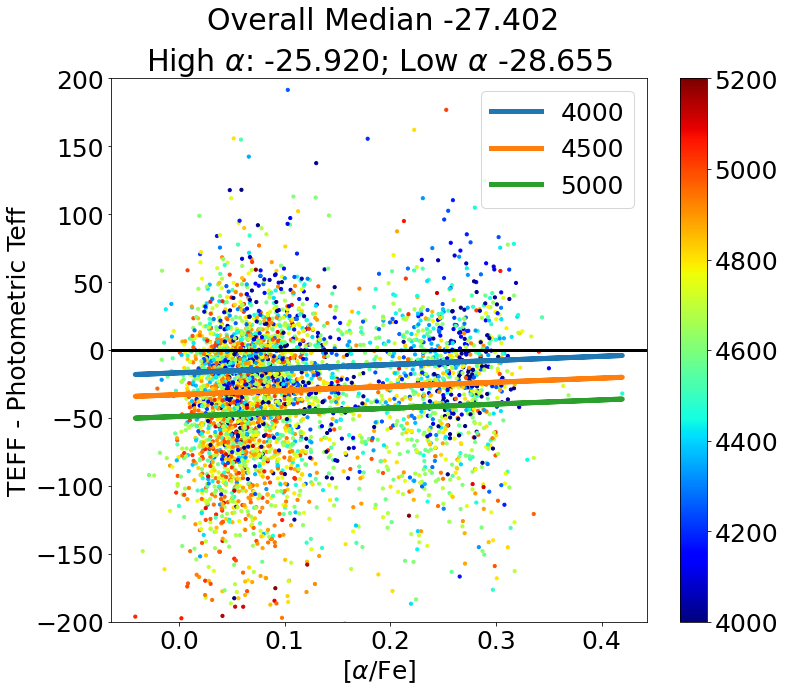

In [36]:
plt.figure(figsize=[12,10])
plt.scatter(apoafe,kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='jet',vmin=4000,vmax=5200,s=10)
plt.colorbar()
plt.axhline(0.,c='k',lw=3)
plt.plot(apoafe,teffresid_teffafe_calibration(4000,apoafe),lw=5.0,label='4000')
plt.plot(apoafe,teffresid_teffafe_calibration(4500,apoafe),lw=5.0,label='4500')
plt.plot(apoafe,teffresid_teffafe_calibration(5000,apoafe),lw=5.0,label='5000')
plt.legend()
# plt.axhline(np.nanmedian(kasc3dr17['TEFF']-photteff),c='green')
# plt.axhline(np.nanmedian((kasc3dr17['TEFF']-photteff)[higha]),c='purple')
# plt.axhline(np.nanmedian((kasc3dr17['TEFF']-photteff)[lowa]),c='red')
plt.ylim(-200,200)
# plt.title(r'Median Residual: {:.3f}'.format(np.nanmedian(kasc3dr17['TEFF']-photteff)))
plt.title(r'High $\alpha$: {:.3f}; Low $\alpha$ {:.3f}'.format(
    np.nanmedian((kasc3dr17['TEFF']-photteff)[higha]),np.nanmedian((kasc3dr17['TEFF']-photteff)[lowa])))
plt.suptitle(r'Overall Median {:.3f}'.format(np.nanmedian(kasc3dr17['TEFF']-photteff)),x=0.44)
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'TEFF - Photometric Teff')
# plt.savefig('../plots/afe_teffresid_teff.pdf',bbox_inches='tight',dpi=300)
plt.show()

In [83]:
np.min(ret.statistic.T)

0.0

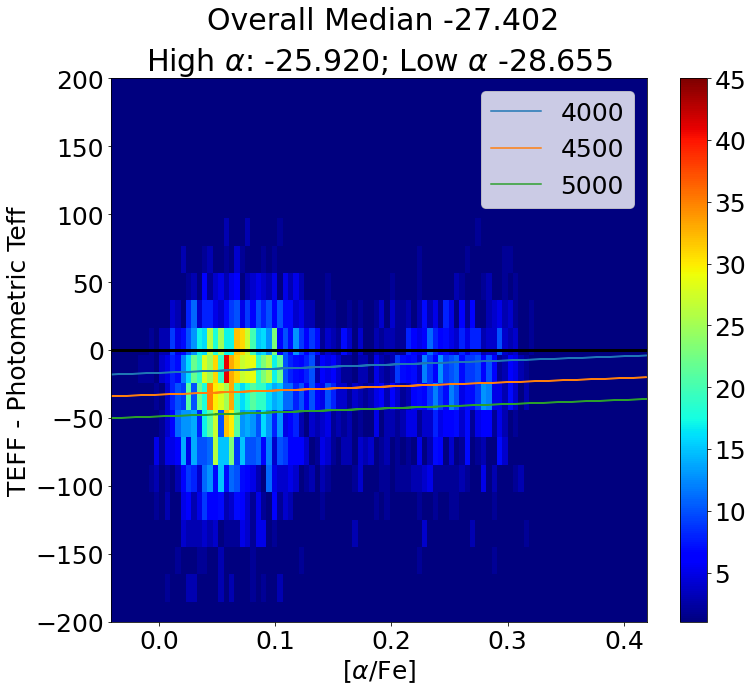

In [101]:
apoafe = np.array(apoafe,dtype=float)
teffresid = np.array(kasc3dr17['TEFF']-photteff,dtype=float)
fincut = np.where((np.isfinite(apoafe)==True)&(np.isfinite(teffresid)==True))
ret = binned_statistic_2d(apoafe[fincut],teffresid[fincut],apoafe[fincut],'count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='jet',vmax=45,vmin=1)

# plt.scatter(apoafe,kasc3dr17['TEFF']-photteff,c=kasc3dr17['TEFF'],cmap='jet',vmin=4000,vmax=5200,s=10)
plt.colorbar()
plt.axhline(0.,c='k',lw=3)
plt.plot(apoafe,teffresid_teffafe_calibration(4000,apoafe),label='4000')
plt.plot(apoafe,teffresid_teffafe_calibration(4500,apoafe),label='4500')
plt.plot(apoafe,teffresid_teffafe_calibration(5000,apoafe),label='5000')
plt.legend()
plt.ylim(-200,200)
plt.title(r'High $\alpha$: {:.3f}; Low $\alpha$ {:.3f}'.format(
    np.nanmedian((kasc3dr17['TEFF']-photteff)[higha]),np.nanmedian((kasc3dr17['TEFF']-photteff)[lowa])))
plt.suptitle(r'Overall Median {:.3f}'.format(np.nanmedian(kasc3dr17['TEFF']-photteff)),x=0.44)
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'TEFF - Photometric Teff')
# plt.savefig('../plots/afe_teffresid_teff.pdf',bbox_inches='tight',dpi=300)
plt.show()

In [63]:
apoafe

array([0.23804502, 0.189135  , 0.23408501, ..., 0.0769513 , 0.053651  ,
       0.048603  ], dtype=float32)

In [37]:
teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],apoafe[fincut])#+(kasc3dr17['TEFF']-photteff)[fincut]

array([-31.733137 , -13.2730465, -32.554935 , ..., -35.771374 ,
       -23.297785 , -31.420618 ], dtype=float32)

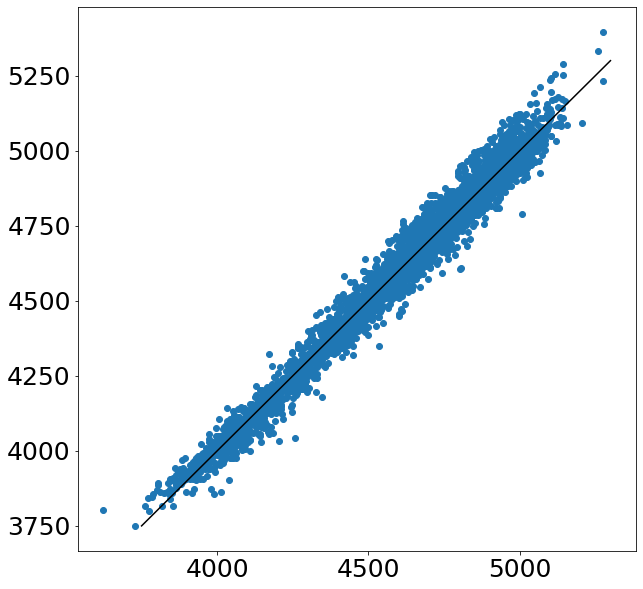

In [38]:
plt.figure(figsize=[10,10])
plt.scatter(kasc3dr17['TEFF'][fincut],teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],
                                                                    apoafe[fincut])+photteff[fincut])
plt.plot([3750,5300],[3750,5300],c='k')

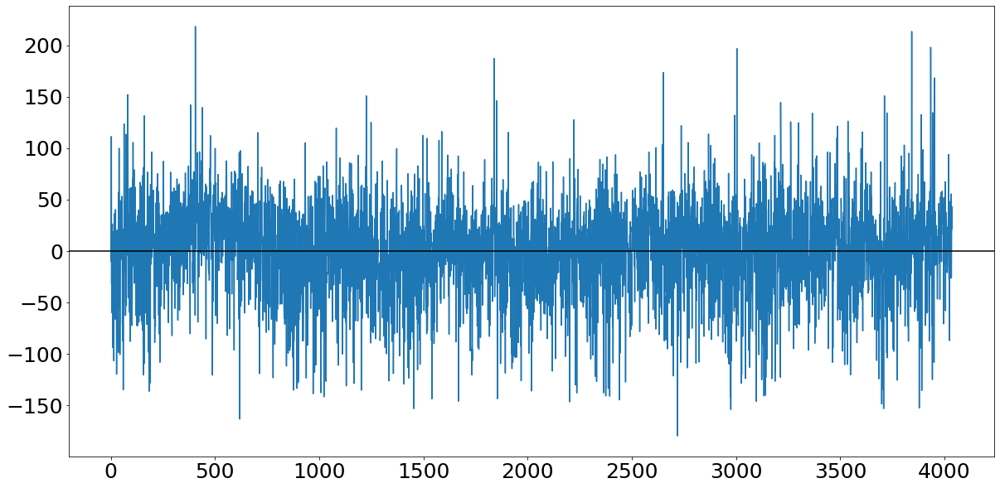

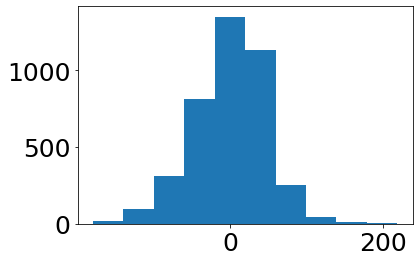

3.757437108698923
29.712719151205874


In [39]:
plt.figure(figsize=[20,10])
plt.plot(kasc3dr17['TEFF'][fincut]-teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],
                                                                    apoafe[fincut])-photteff[fincut])
plt.axhline(0.0,c='k')
plt.show()

plt.hist(kasc3dr17['TEFF'][fincut]-teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],
                                                                    apoafe[fincut])-photteff[fincut])
plt.show()
print(np.median(kasc3dr17['TEFF'][fincut]-teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],
                                                                    apoafe[fincut])-photteff[fincut]))
print(mad(kasc3dr17['TEFF'][fincut]-teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],
                                                                    apoafe[fincut])-photteff[fincut]))

In [40]:
(kasc3dr17['TEFF']-photteff)[fincut]

array([-33.57817898, -23.03572581, -25.39986785, ..., -28.02150275,
        19.83163117,  -9.55125685])

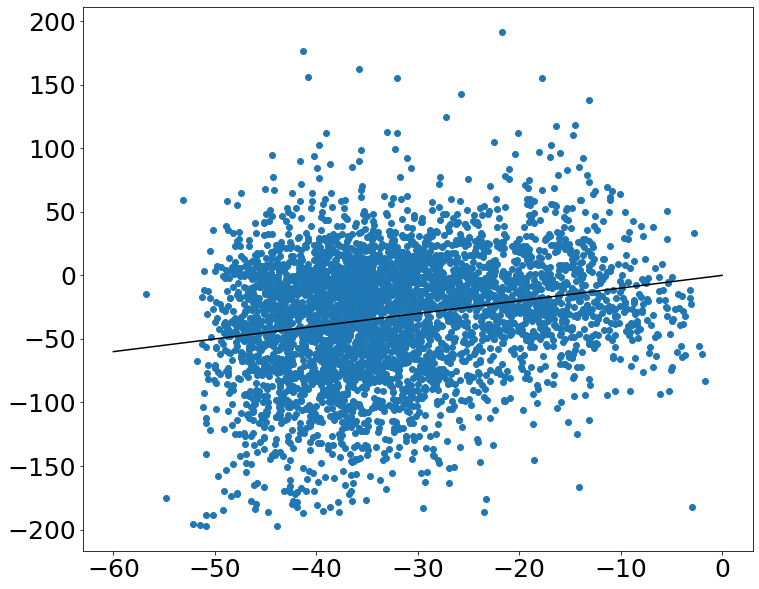

In [41]:
plt.figure(figsize=[12,10])
plt.scatter(teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],
                                          apoafe[fincut]),(kasc3dr17['TEFF']-photteff)[fincut])

plt.plot([-60,0],[-60,0],c='k')
plt.show()

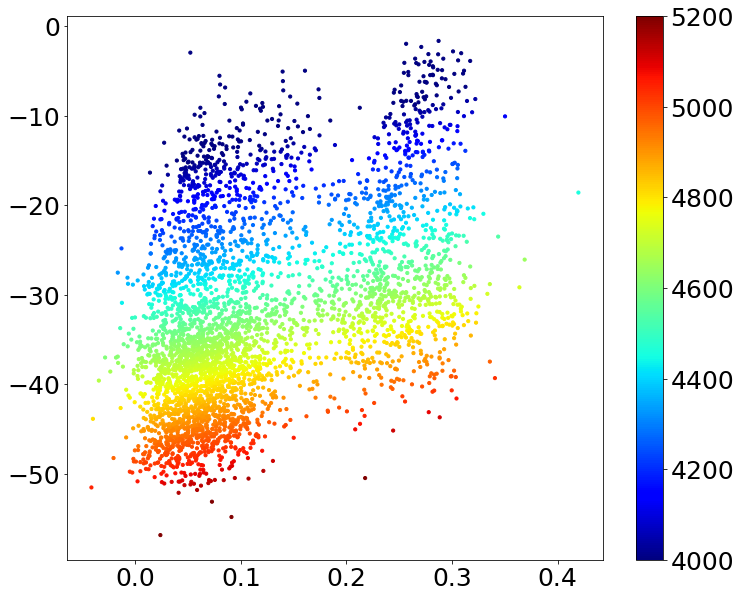

In [42]:
plt.figure(figsize=[12,10])
plt.scatter(apoafe[fincut],teffresid_teffafe_calibration(kasc3dr17['TEFF'][fincut],apoafe[fincut]),
            c=kasc3dr17['TEFF'][fincut],cmap='jet',vmin=4000,vmax=5200,s=10)

plt.colorbar()
plt.show()

# Ages

In [43]:
# ages = Table(fits.getdata('APOKASC_rgb_SalarisCNAlpha.fits'))
# ages.columns

In [44]:
def upturn10Gyr(age):
    '''
    Boundary for 10 Gyr upturn in Aetas and APOKASC plot 
    
    Input:
    -----
        age: age in Gyr
        
    Output:
    ------
        ups: value on boundary 
    '''
    ups = np.ones(np.size(age))
    for i in range(np.size(age)):
        if age[i] <= 11:
            up = 11

        else:
            up = age[i]
            
        ups[i] = up

    return ups

def oldapokasc(age):
    '''
    Boundary for old stars in APOKASC given young age by Aetas
    
    Input:
    -----
        age: age in Gyr
    
    Output:
    ------
        olds: value on boundary
    '''
    olds = np.ones(np.size(age))
    for i in range(np.size(age)):
        olds[i] = age[i] - 4
        
    return olds

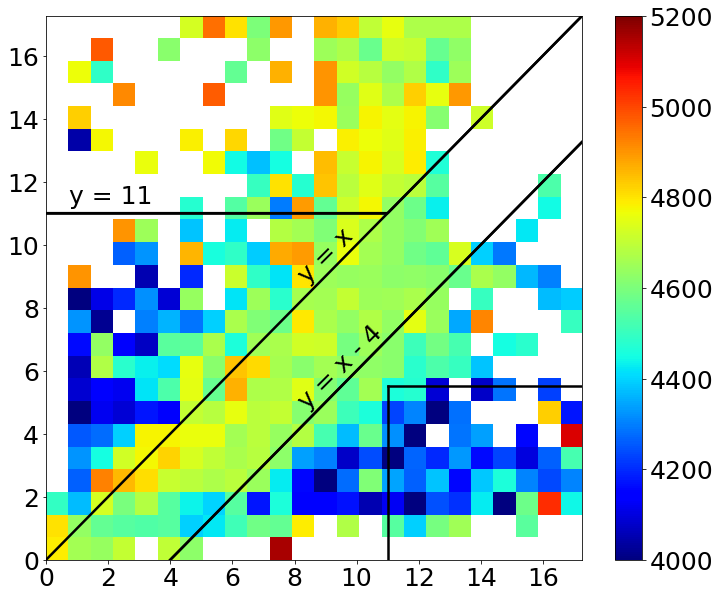

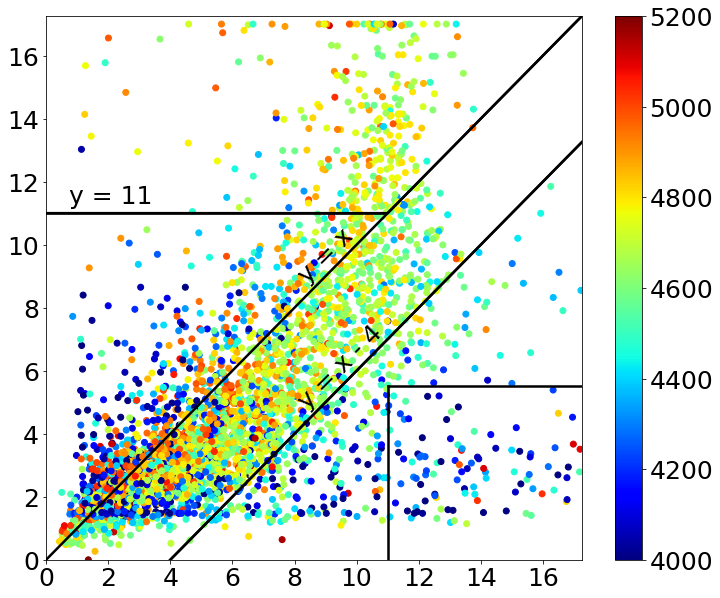

In [45]:
from scipy.stats import binned_statistic_2d

badcut = np.where(ages['AGE']<999999.0)
x = kasc3['IntAge'][badcut]
y = ages['AGE'][badcut]

xmax = 18
ymax = 18
nbins = 25

ret = binned_statistic_2d(x,y,kasc3dr17['TEFF'][badcut],'median',
                          bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)])

plt.figure(figsize=[12,10])
plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='jet',vmin=4000,vmax=5200)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.show()

#### Scatterplot Version ####
plt.figure(figsize=[12,10])
# plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#            aspect='auto',interpolation='nearest',cmap='jet',vmin=4000,vmax=5200)

plt.scatter(x,y,c=kasc3dr17['TEFF'][badcut],cmap='jet',vmin=4000,vmax=5200)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.show()

In [46]:
print(np.median((kasc3dr17['TEFF']-photteff)[np.where(kasc3dr17['TEFF']<4000)]))

-28.657132065856786


In [47]:
print(np.median((kasc3dr17['TEFF']-photteff)[np.where(kasc3dr17['TEFF']<4000)]))
print(p4042)
print(p4244)
print(p4446)
print(p4648)
print(p4850)
print(p5052)
print(np.median((kasc3dr17['TEFF']-photteff)[np.where(kasc3dr17['TEFF']>5200)]))

-28.657132065856786


NameError: name 'p4042' is not defined

In [48]:
def teffcorrection(teff,afe):
    '''
    Calculate the Teff correction as a function of [alpha/Fe]. Teff calibration is done with photometric
    Teffs from Gonz\'{a}lez Hern\'{a}ndez & Bonifacio 2009 using J - K (dereddened using age code). This 
    somewhat follows the method of J\''{o}nsson et al. 2020 for the Teff calibration of APOGEE DR16
    
    Input:
    -----
        teff: Teff of a star
        afe: [alpha/Fe] of a star
        
    Output:
    ------
        corrected Teff
    '''
    
    if teff < 4000.:
        return teff + 28.657132065856786
    
    elif (teff >= 4000) & (teff < 4200):
        return teff - 65.69*afe + 24.84
    
    elif (teff >= 4200) & (teff < 4400):
        return teff - 16.51*afe + 19.66
    
    elif (teff >= 4400) & (teff < 4600):
        return teff - 100.8*afe + 33.79
    
    elif (teff >= 4600) & (teff < 4800):
        return teff - 72.94*afe + 47.53
    
    elif (teff >= 4800) & (teff < 5000):
        return teff - 27.5*afe + 43.82
    
    elif (teff >= 5000) & (teff < 5200):
        return teff - 290.2*afe + 74.76
    
    elif teff >= 5200:
        return teff + 68.34375701345334

In [49]:
corrteff = np.ones(len(kasc3dr17))

for i in range(len(kasc3dr17)):
    corrteff[i] = teffcorrection(kasc3dr17['TEFF'][i],apoafe[i])

In [50]:
np.where(np.isfinite(corrteff)==False)

(array([], dtype=int64),)

(array([   7.,   99.,  316.,  322.,  457.,  602., 1120.,  799.,  314.,
          22.]),
 array([3651.76260082, 3820.96182972, 3990.16105862, 4159.36028752,
        4328.55951642, 4497.75874532, 4666.95797422, 4836.15720312,
        5005.35643202, 5174.55566092, 5343.75488983]),
 <a list of 10 Patch objects>)

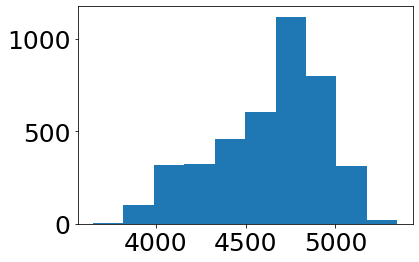

In [51]:
plt.hist(corrteff)

In [52]:
len(np.squeeze(badcut))
len(corrteff)

4058

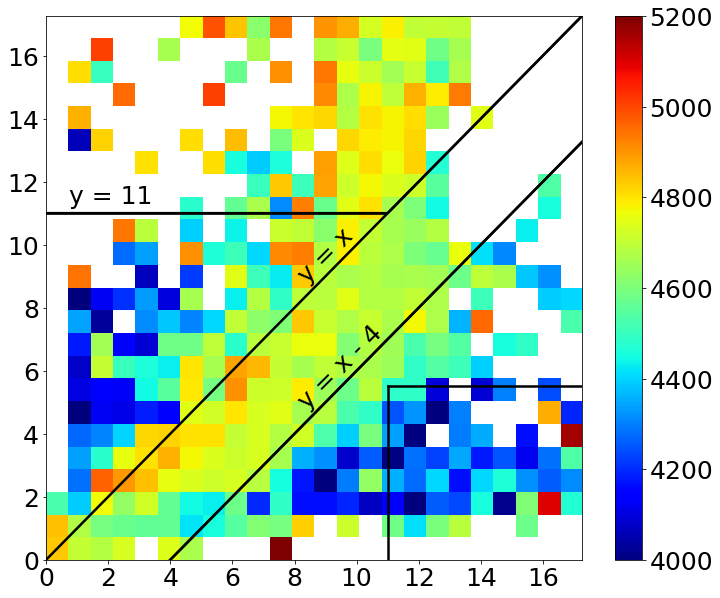

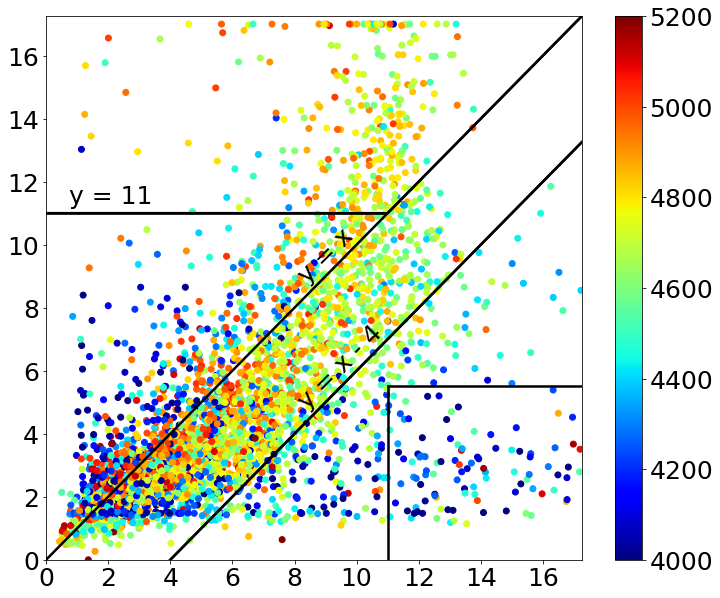

In [53]:
# badcut = np.where(ages['AGE']<999999.0)
# x = kasc3['IntAge'][badcut]
# y = ages['AGE'][badcut]

xmax = 18
ymax = 18
nbins = 25

ret = binned_statistic_2d(x,y,corrteff[badcut],'median',
                          bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)])

plt.figure(figsize=[12,10])
plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='jet',vmin=4000,vmax=5200)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.savefig('../plots/age_age_corrteff.pdf',bbox_inches='tight',dpi=300)
plt.show()

#### Scatterplot Version ####
plt.figure(figsize=[12,10])
# plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#            aspect='auto',interpolation='nearest',cmap='jet',vmin=4000,vmax=5200)

plt.scatter(x,y,c=corrteff[badcut],cmap='jet',vmin=4000,vmax=5200)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.savefig('../plots/age_age_corrteff_scatter.pdf',bbox_inches='tight',dpi=300)
plt.show()

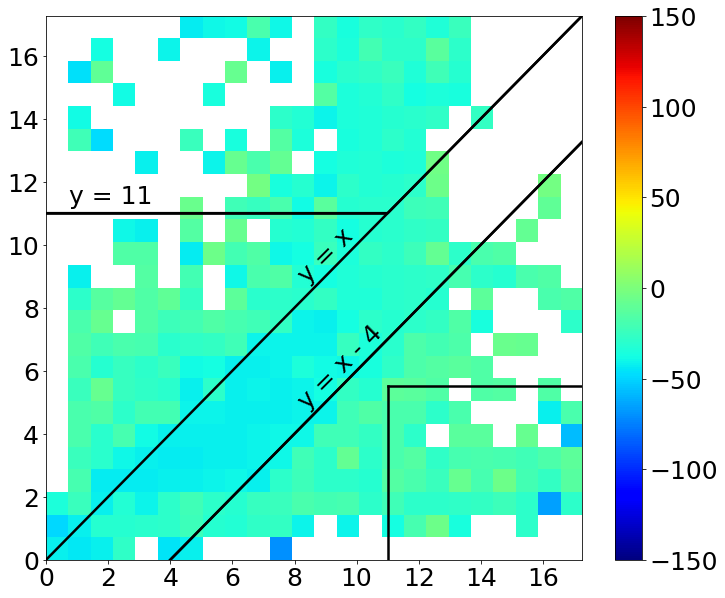

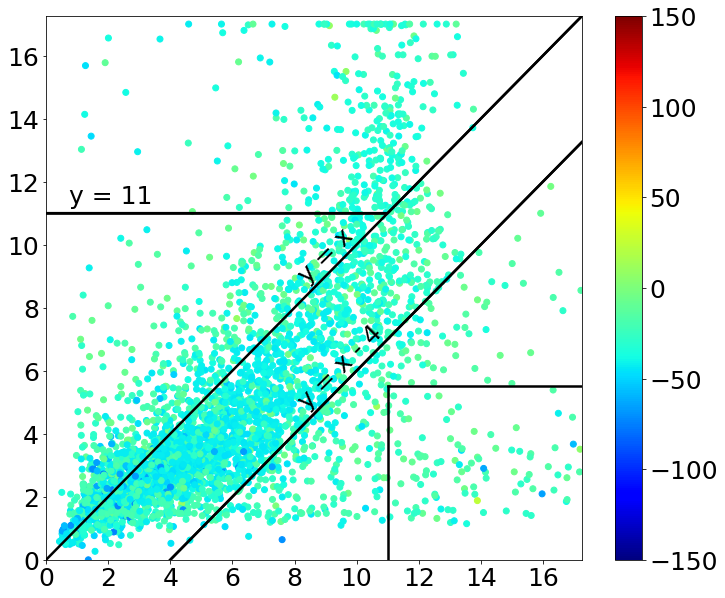

In [54]:
xmax = 18
ymax = 18
nbins = 25

ret = binned_statistic_2d(x,y,(kasc3dr17['TEFF']-corrteff)[badcut],'median',
                          bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)])

plt.figure(figsize=[12,10])
plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='jet',vmin=-150,vmax=150)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.savefig('../plots/age_age_teffresid.pdf',bbox_inches='tight',dpi=300)
plt.show()

#### Scatterplot Version ####
plt.figure(figsize=[12,10])
# plt.imshow(ret.statistic.T, origin='lower',extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
#            aspect='auto',interpolation='nearest',cmap='jet',vmin=4000,vmax=5200)

plt.scatter(x,y,c=(kasc3dr17['TEFF']-corrteff)[badcut],cmap='jet',vmin=-150,vmax=150)
plt.colorbar()

plt.plot(np.arange(0,18,0.25),upturn10Gyr(np.arange(0,18,0.25)),c='k',lw=2.5)
plt.plot(np.arange(0,18,0.25),oldapokasc(np.arange(0,18,0.25)),c='k',lw=2.5)

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(18)[::2],np.arange(18)[::2].astype(str))
plt.savefig('../plots/age_age_teffresid_scatter.pdf',bbox_inches='tight',dpi=300)
plt.show()

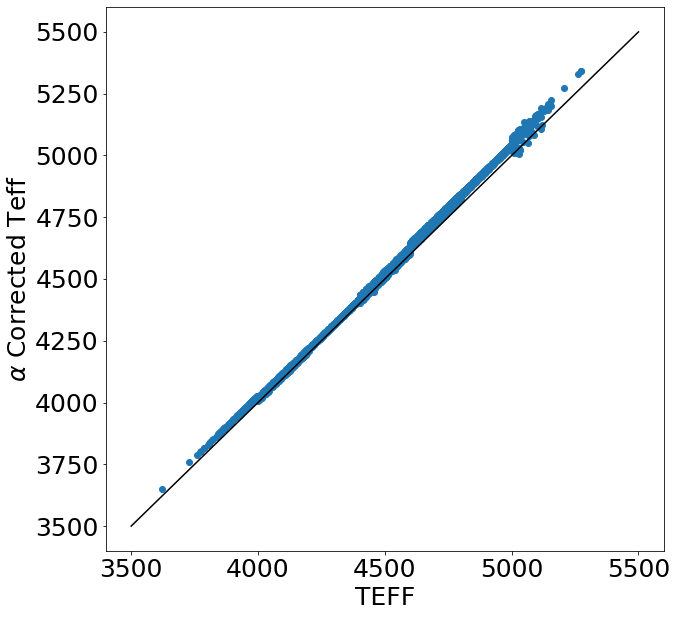

In [55]:
plt.figure(figsize=[10,10])
plt.scatter(kasc3dr17['TEFF'],corrteff)
plt.plot([3500,5500],[3500,5500],c='k')
plt.xlabel(r'TEFF')
plt.ylabel(r'$\alpha$ Corrected Teff')
plt.savefig('../plots/corrteff_teff.pdf',bbox_inches='tight',dpi=300)

Text(0.5, 1.0, '$\\alpha$ Corrected Teff - Teff; Median Residual: 36.025')

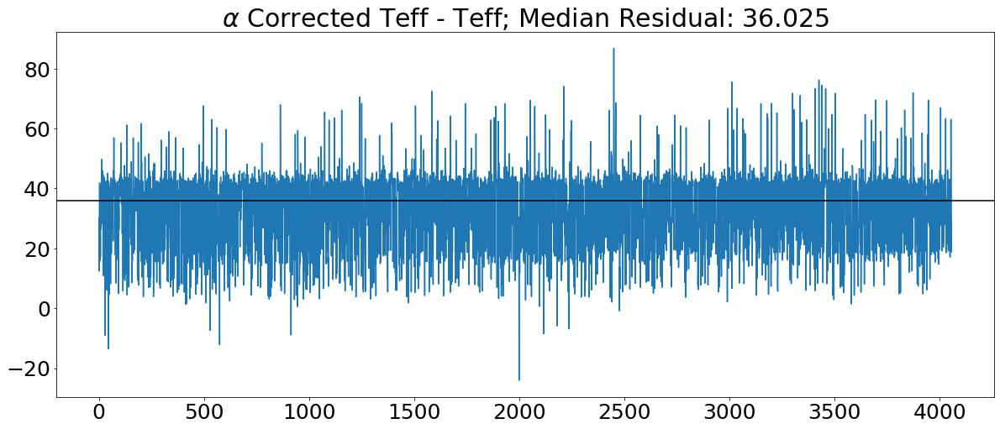

In [56]:
plt.figure(figsize=[20,8])
plt.plot(corrteff-kasc3dr17['TEFF'])
plt.axhline(np.median(corrteff-kasc3dr17['TEFF']),c='k')
plt.title(r'$\alpha$ Corrected Teff - Teff; Median Residual: {:.3f}'.format(np.median(corrteff-kasc3dr17['TEFF'])))

##################################################################################################################

# Ages

In [106]:
ages0 = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/APOKASC_rgb_Sal_age_ak.fits')
ages125 = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/APOKASC_rgb_TeffPos_HighALPHA125.fits')
ages25 = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/APOKASC_rgb_TeffPos25_HighALPHA.fits')
ages375 = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/APOKASC_rgb_TeffPos_HighALPHA375.fits')
ages50 = fits.getdata('/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting/notebooks/APOKASC_rgb_TeffPos50_HighALPHA.fits')

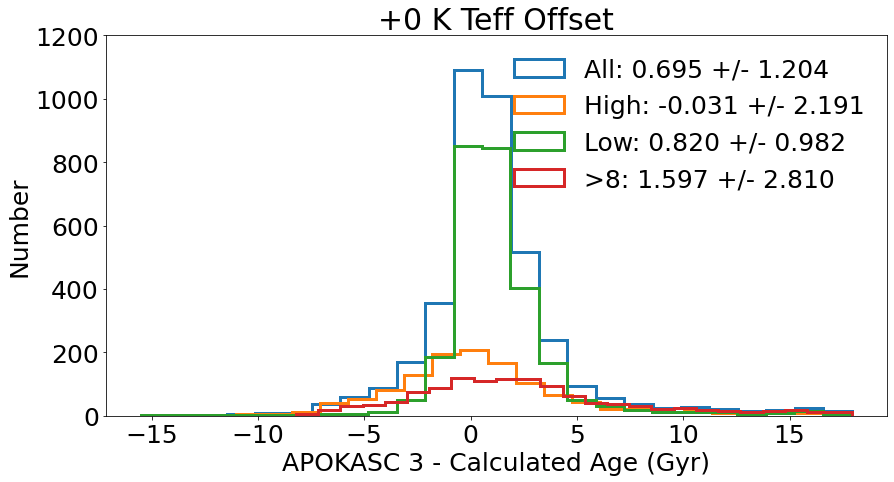

In [123]:
allbad0 = np.where((ages0['AGE']<100.)&(kasc3['IntAge']-ages0['AGE']<18.))
hibad0 = np.where((ages0['AGE'][higha]<100.)&((kasc3['IntAge']-ages0['AGE'])[higha]<18.))
lobad0 = np.where((ages0['AGE'][lowa]<100.)&((kasc3['IntAge']-ages0['AGE'])[lowa]<18.))
_8bad0 = np.where((ages0['AGE']<100.)&(kasc3['IntAge']>8.)&(kasc3['IntAge']-ages0['AGE']<18.))

plt.figure(figsize=[14,7])
plt.hist((kasc3['IntAge']-ages0['AGE'])[allbad0],bins=25,histtype='step',lw=3.0,
         label='All: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages0['AGE'])[allbad0]),mad((kasc3['IntAge']-ages0['AGE'])[allbad0])))
plt.hist((kasc3['IntAge']-ages0['AGE'])[higha][hibad0],bins=25,histtype='step',lw=3.0,
         label='High: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages0['AGE'])[higha][hibad0]),mad((kasc3['IntAge']-ages0['AGE'])[higha][hibad0])))
plt.hist((kasc3['IntAge']-ages0['AGE'])[lowa][lobad0],bins=25,histtype='step',lw=3.0,
         label='Low: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages0['AGE'])[lowa][lobad0]),mad((kasc3['IntAge']-ages0['AGE'])[lowa][lobad0])))

plt.hist((kasc3['IntAge']-ages0['AGE'])[_8bad0],bins=25,histtype='step',lw=3.0,
         label='>8: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages0['AGE'])[_8bad0]),mad((kasc3['IntAge']-ages0['AGE'])[_8bad0])))

plt.ylim(top=1200)

plt.legend(frameon=False)
plt.title('+0 K Teff Offset')
plt.xlabel(r'APOKASC 3 - Calculated Age (Gyr)')
plt.ylabel(r'Number')
plt.savefig('../plots/age_histogram0_1200.pdf',dpi=300,bbox_inches='tight')
plt.show()

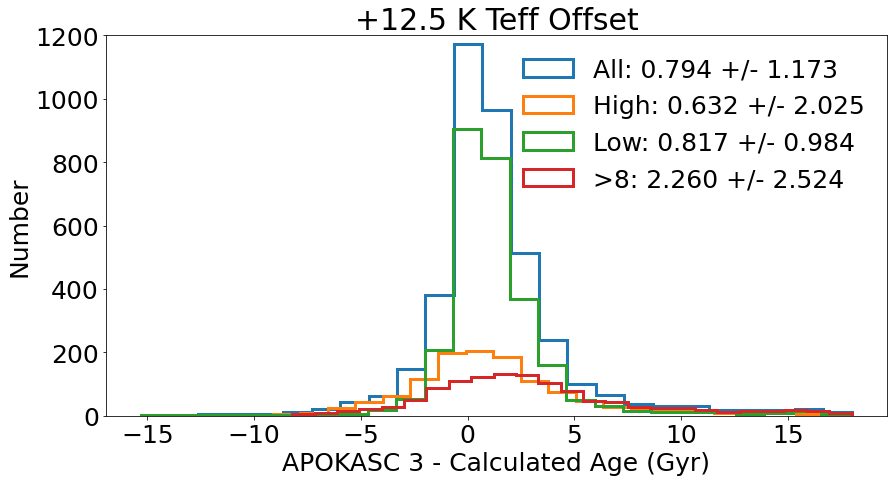

In [124]:
allbad125 = np.where((ages125['AGE']<100.)&(kasc3['IntAge']-ages125['AGE']<18.))
hibad125 = np.where((ages125['AGE'][higha]<100.)&((kasc3['IntAge']-ages125['AGE'])[higha]<18.))
lobad125 = np.where((ages125['AGE'][lowa]<100.)&((kasc3['IntAge']-ages125['AGE'])[lowa]<18.))
_8bad125 = np.where((ages125['AGE']<100.)&(kasc3['IntAge']>8.)&(kasc3['IntAge']-ages125['AGE']<18.))

plt.figure(figsize=[14,7])
plt.hist((kasc3['IntAge']-ages125['AGE'])[allbad125],bins=25,histtype='step',lw=3.0,
         label='All: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages125['AGE'])[allbad125]),mad((kasc3['IntAge']-ages125['AGE'])[allbad125])))
plt.hist((kasc3['IntAge']-ages125['AGE'])[higha][hibad125],bins=25,histtype='step',lw=3.0,
         label='High: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages125['AGE'])[higha][hibad125]),mad((kasc3['IntAge']-ages125['AGE'])[higha][hibad125])))
plt.hist((kasc3['IntAge']-ages125['AGE'])[lowa][lobad125],bins=25,histtype='step',lw=3.0,
         label='Low: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages125['AGE'])[lowa][lobad125]),mad((kasc3['IntAge']-ages125['AGE'])[lowa][lobad125])))

plt.hist((kasc3['IntAge']-ages125['AGE'])[_8bad125],bins=25,histtype='step',lw=3.0,
         label='>8: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages125['AGE'])[_8bad125]),mad((kasc3['IntAge']-ages125['AGE'])[_8bad125])))

plt.ylim(top=1200)

plt.legend(frameon=False)
plt.title('+12.5 K Teff Offset')
plt.xlabel(r'APOKASC 3 - Calculated Age (Gyr)')
plt.ylabel(r'Number')
plt.savefig('../plots/age_histogram125_1200.pdf',dpi=300,bbox_inches='tight')
plt.show()

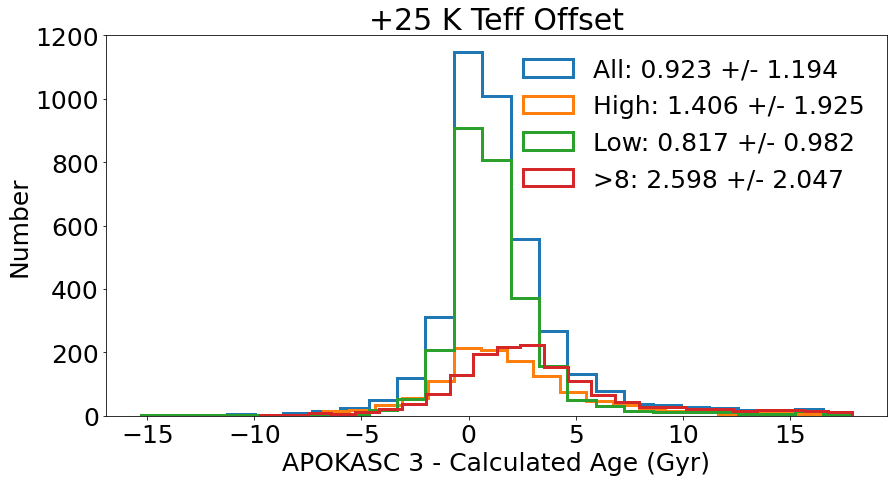

In [126]:
allbad25 = np.where((ages25['AGE']<100.)&(kasc3['IntAge']-ages25['AGE']<18.))
hibad25 = np.where((ages25['AGE'][higha]<100.)&((kasc3['IntAge']-ages25['AGE'])[higha]<18.))
lobad25 = np.where((ages25['AGE'][lowa]<100.)&((kasc3['IntAge']-ages25['AGE'])[lowa]<18.))
_8bad25 = np.where((ages25['AGE']<100.)&(kasc3['IntAge']>7.)&(kasc3['IntAge']-ages25['AGE']<18.))

plt.figure(figsize=[14,7])
plt.hist((kasc3['IntAge']-ages25['AGE'])[allbad25],bins=25,histtype='step',lw=3.0,
         label='All: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages25['AGE'])[allbad25]),mad((kasc3['IntAge']-ages25['AGE'])[allbad25])))
plt.hist((kasc3['IntAge']-ages25['AGE'])[higha][hibad25],bins=25,histtype='step',lw=3.0,
         label='High: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages25['AGE'])[higha][hibad25]),mad((kasc3['IntAge']-ages25['AGE'])[higha][hibad25])))
plt.hist((kasc3['IntAge']-ages25['AGE'])[lowa][lobad25],bins=25,histtype='step',lw=3.0,
         label='Low: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages25['AGE'])[lowa][lobad25]),mad((kasc3['IntAge']-ages25['AGE'])[lowa][lobad25])))

plt.hist((kasc3['IntAge']-ages25['AGE'])[_8bad25],bins=25,histtype='step',lw=3.0,
         label='>8: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages25['AGE'])[_8bad25]),mad((kasc3['IntAge']-ages25['AGE'])[_8bad25])))

plt.ylim(top=1200)

plt.legend(frameon=False)
plt.title('+25 K Teff Offset')
plt.xlabel(r'APOKASC 3 - Calculated Age (Gyr)')
plt.ylabel(r'Number')
plt.savefig('../plots/age_histogram25_1200.pdf',dpi=300,bbox_inches='tight')
plt.show()

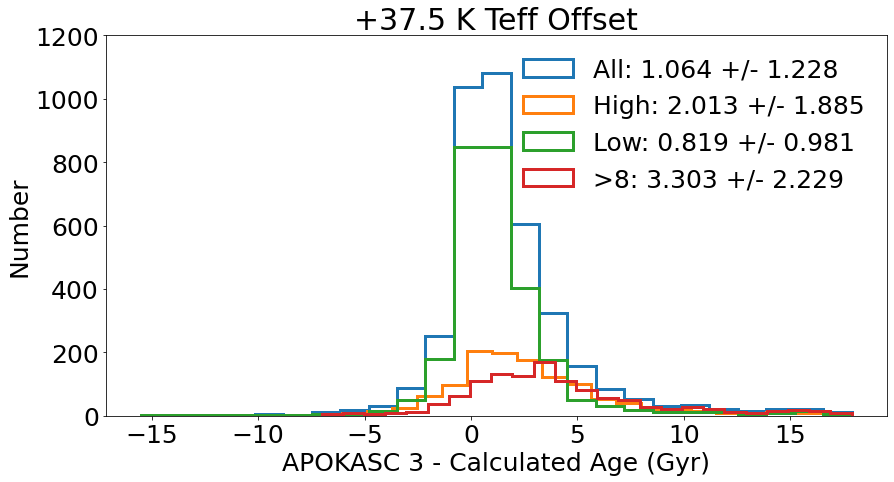

In [127]:
allbad375 = np.where((ages375['AGE']<100.)&(kasc3['IntAge']-ages375['AGE']<18.))
hibad375 = np.where((ages375['AGE'][higha]<100.)&((kasc3['IntAge']-ages375['AGE'])[higha]<18.))
lobad375 = np.where((ages375['AGE'][lowa]<100.)&((kasc3['IntAge']-ages375['AGE'])[lowa]<18.))
_8bad375 = np.where((ages375['AGE']<100.)&(kasc3['IntAge']>8.)&(kasc3['IntAge']-ages375['AGE']<18.))

plt.figure(figsize=[14,7])
plt.hist((kasc3['IntAge']-ages375['AGE'])[allbad375],bins=25,histtype='step',lw=3.0,
         label='All: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages375['AGE'])[allbad375]),mad((kasc3['IntAge']-ages375['AGE'])[allbad375])))
plt.hist((kasc3['IntAge']-ages375['AGE'])[higha][hibad375],bins=25,histtype='step',lw=3.0,
         label='High: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages375['AGE'])[higha][hibad375]),mad((kasc3['IntAge']-ages375['AGE'])[higha][hibad375])))
plt.hist((kasc3['IntAge']-ages375['AGE'])[lowa][lobad375],bins=25,histtype='step',lw=3.0,
         label='Low: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages375['AGE'])[lowa][lobad375]),mad((kasc3['IntAge']-ages375['AGE'])[lowa][lobad375])))

plt.hist((kasc3['IntAge']-ages375['AGE'])[_8bad375],bins=25,histtype='step',lw=3.0,
         label='>8: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages375['AGE'])[_8bad375]),mad((kasc3['IntAge']-ages375['AGE'])[_8bad375])))

plt.ylim(top=1200)

plt.legend(frameon=False)
plt.title('+37.5 K Teff Offset')
plt.xlabel(r'APOKASC 3 - Calculated Age (Gyr)')
plt.ylabel(r'Number')
plt.savefig('../plots/age_histogram375_1200.pdf',dpi=300,bbox_inches='tight')
plt.show()

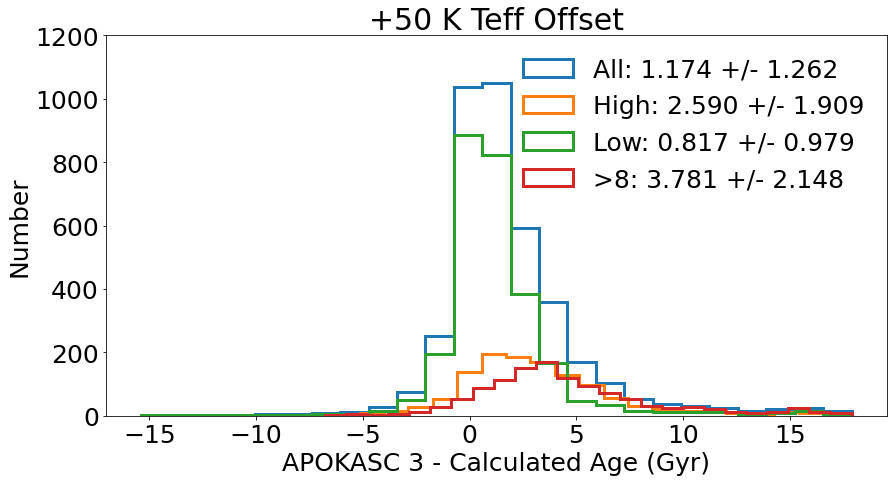

In [131]:
allbad50 = np.where((ages50['AGE']<100.)&(kasc3['IntAge']-ages50['AGE']<18.))
hibad50 = np.where((ages50['AGE'][higha]<100.)&((kasc3['IntAge']-ages50['AGE'])[higha]<18.))
lobad50 = np.where((ages50['AGE'][lowa]<100.)&((kasc3['IntAge']-ages50['AGE'])[lowa]<18.))
_8bad50 = np.where((ages50['AGE']<100.)&(kasc3['IntAge']>8.)&(kasc3['IntAge']-ages50['AGE']<18.))

plt.figure(figsize=[14,7])
plt.hist((kasc3['IntAge']-ages50['AGE'])[allbad50],bins=25,histtype='step',lw=3.0,
         label='All: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[allbad50]),mad((kasc3['IntAge']-ages50['AGE'])[allbad50])))
plt.hist((kasc3['IntAge']-ages50['AGE'])[higha][hibad50],bins=25,histtype='step',lw=3.0,
         label='High: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[higha][hibad50]),mad((kasc3['IntAge']-ages50['AGE'])[higha][hibad50])))
plt.hist((kasc3['IntAge']-ages50['AGE'])[lowa][lobad50],bins=25,histtype='step',lw=3.0,
         label='Low: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[lowa][lobad50]),mad((kasc3['IntAge']-ages50['AGE'])[lowa][lobad50])))

plt.hist((kasc3['IntAge']-ages50['AGE'])[_8bad50],bins=25,histtype='step',lw=3.0,
         label='>8: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[_8bad50]),mad((kasc3['IntAge']-ages50['AGE'])[_8bad50])))

plt.ylim(top=1200)

plt.legend(frameon=False)
plt.title('+50 K Teff Offset')
plt.xlabel(r'APOKASC 3 - Calculated Age (Gyr)')
plt.ylabel(r'Number')
plt.savefig('../plots/age_histogram50_1200.pdf',dpi=300,bbox_inches='tight')
plt.show()

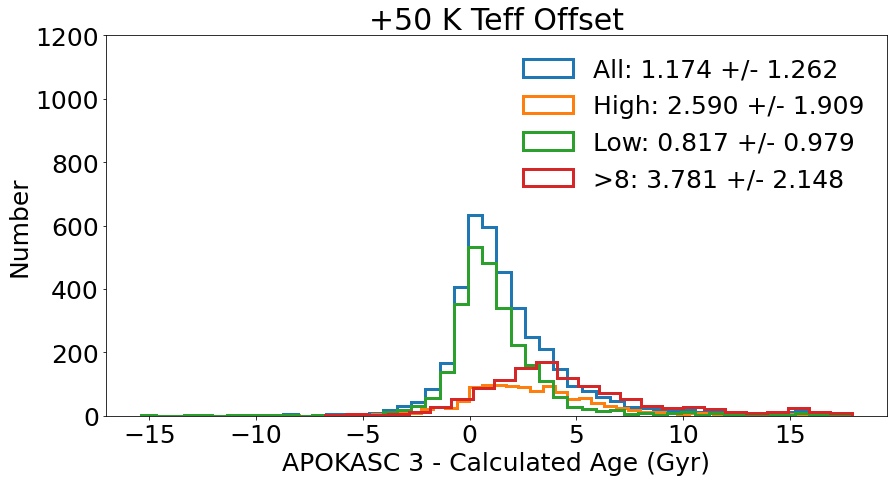

In [128]:
# allbad50 = np.where((ages50['AGE']<100.)&(kasc3['IntAge']-ages50['AGE']<18.))
# hibad50 = np.where((ages50['AGE'][higha]<100.)&((kasc3['IntAge']-ages50['AGE'])[higha]<18.))
# lobad50 = np.where((ages50['AGE'][lowa]<100.)&((kasc3['IntAge']-ages50['AGE'])[lowa]<18.))
# _8bad50 = np.where((ages50['AGE']<100.)&(kasc3['IntAge']>8.)&(kasc3['IntAge']-ages50['AGE']<18.))

# plt.figure(figsize=[14,7])
# plt.hist((kasc3['IntAge']-ages50['AGE'])[allbad50],bins=50,histtype='step',lw=3.0,
#          label='All: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[allbad50]),mad((kasc3['IntAge']-ages50['AGE'])[allbad50])))
# plt.hist((kasc3['IntAge']-ages50['AGE'])[higha][hibad50],bins=50,histtype='step',lw=3.0,
#          label='High: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[higha][hibad50]),mad((kasc3['IntAge']-ages50['AGE'])[higha][hibad50])))
# plt.hist((kasc3['IntAge']-ages50['AGE'])[lowa][lobad50],bins=50,histtype='step',lw=3.0,
#          label='Low: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[lowa][lobad50]),mad((kasc3['IntAge']-ages50['AGE'])[lowa][lobad50])))

# plt.hist((kasc3['IntAge']-ages50['AGE'])[_8bad50],bins=25,histtype='step',lw=3.0,
#          label='>8: {:.3f} +/- {:.3f}'.format(np.median((kasc3['IntAge']-ages50['AGE'])[_8bad50]),mad((kasc3['IntAge']-ages50['AGE'])[_8bad50])))

# plt.ylim(top=1200)

# plt.legend(frameon=False)
# plt.title('+50 K Teff Offset')
# plt.xlabel(r'APOKASC 3 - Calculated Age (Gyr)')
# plt.ylabel(r'Number')
# plt.savefig('../plots/age_histogram50_1200.pdf',dpi=300,bbox_inches='tight')
plt.show()

# Age-Age

In [59]:
def upturn10Gyr(age):
    '''
    Boundary for 10 Gyr upturn in Aetas and APOKASC plot 
    
    Input:
    -----
        age: age in Gyr
        
    Output:
    ------
        ups: value on boundary 
    '''
    ups = np.ones(np.size(age))
    for i in range(np.size(age)):
        if age[i] <= 11:
            up = 11

        else:
            up = age[i]
            
        ups[i] = up

    return ups

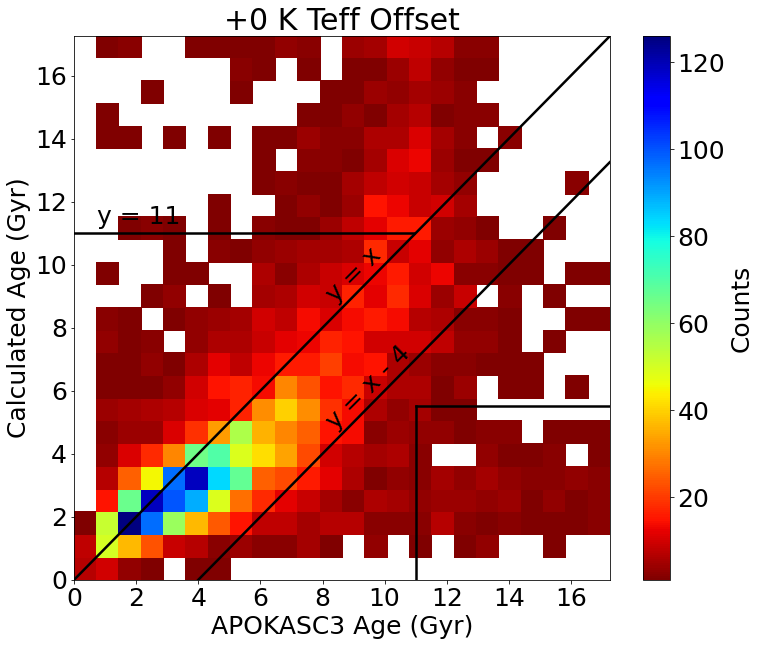

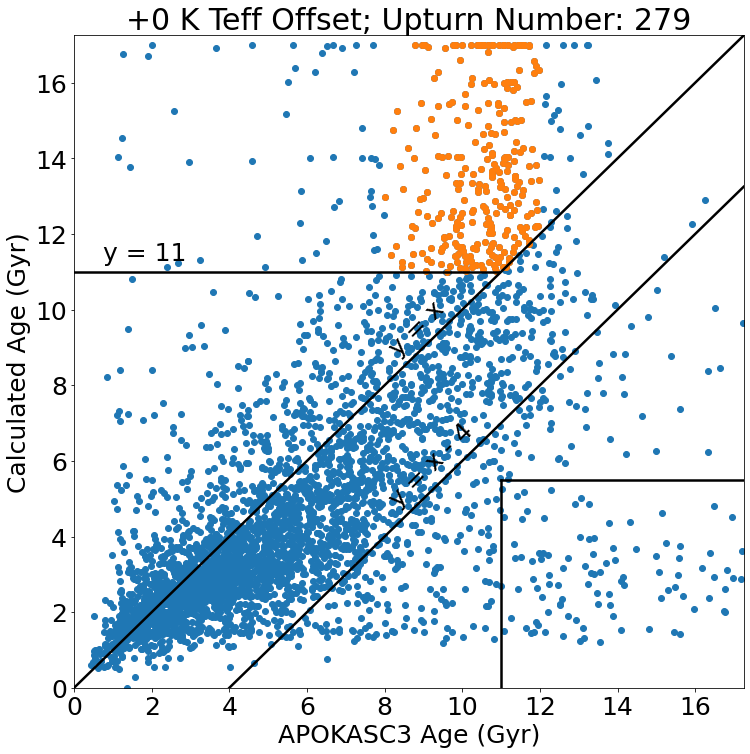

In [94]:
##########
### +0 ###
##########

xmax = 18
ymax = 18
nbins = 25

plt.figure(figsize=[12,10])
plt.hist2d(kasc3['IntAge'][allbad0],ages0['AGE'][allbad0],
           bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)],cmap='jet_r',cmin=1)
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')
plt.title(r'+0 K Teff Offset')

### Scatter

upbox0 = np.where((ages0['AGE'][allbad0]-upturn10Gyr(kasc3['IntAge'][allbad0])>0.0)&
         (kasc3['IntAge'][allbad0]>8.0)&(kasc3['IntAge'][allbad0]<12))

plt.figure(figsize=[12,12])
plt.scatter(kasc3['IntAge'][allbad0],ages0['AGE'][allbad0])
plt.scatter(kasc3['IntAge'][allbad0][upbox0],ages0['AGE'][allbad0][upbox0])
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
# cbar = plt.colorbar()
# cbar.ax.set_ylabel('Counts')
plt.title(r'+0 K Teff Offset; Upturn Number: {}'.format(len(np.squeeze(upbox0))))
plt.savefig('../plots/age_age_scatter0.pdf',dpi=300,bbox_inches='tight')
plt.show()

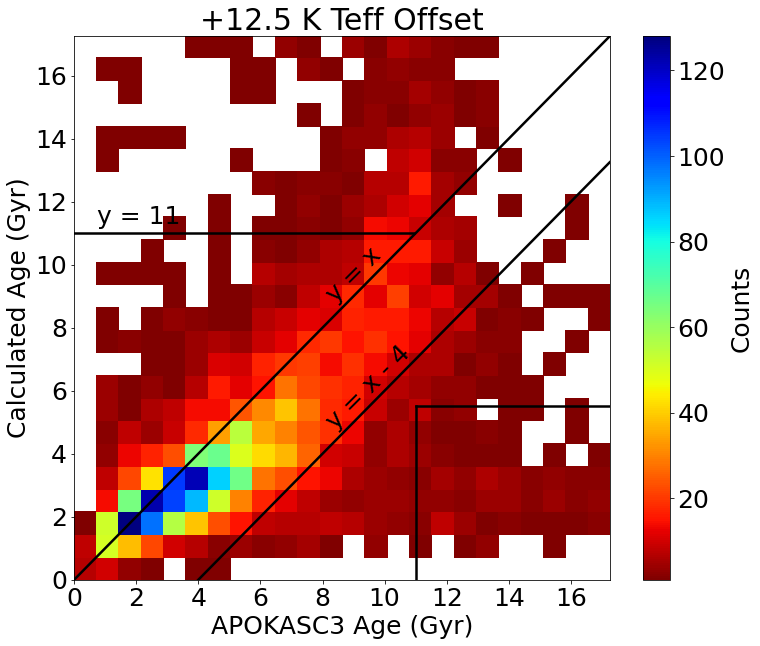

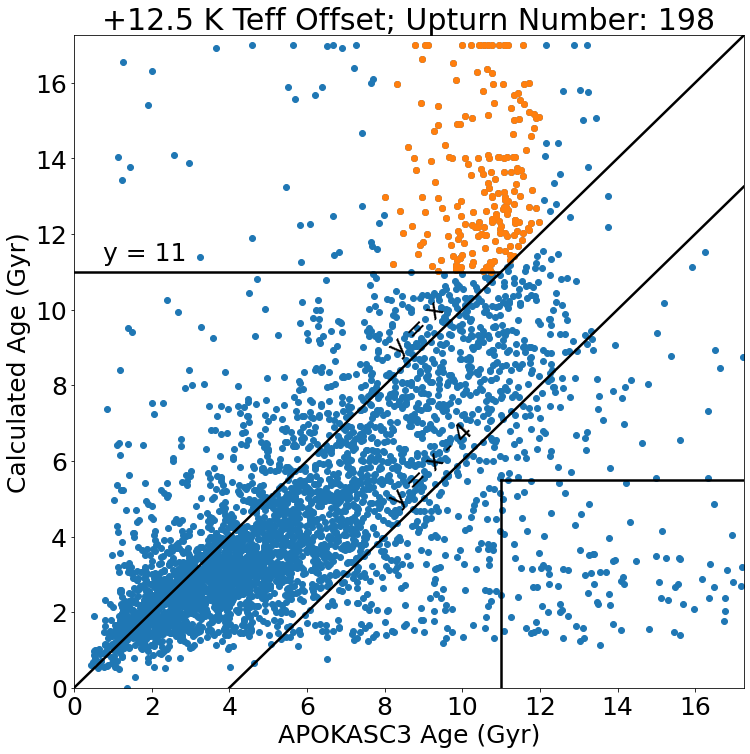

In [82]:
#############
### +12.5 ###
#############

xmax = 18
ymax = 18
nbins = 25

plt.figure(figsize=[12,10])
plt.hist2d(kasc3['IntAge'][allbad125],ages125['AGE'][allbad125],
           bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)],cmap='jet_r',cmin=1)
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')
plt.title(r'+12.5 K Teff Offset')

### Scatter

upbox125 = np.where((ages125['AGE'][allbad125]-upturn10Gyr(kasc3['IntAge'][allbad125])>0.0)&
         (kasc3['IntAge'][allbad125]>8.0)&(kasc3['IntAge'][allbad125]<12))

plt.figure(figsize=[12,12])
plt.scatter(kasc3['IntAge'][allbad125],ages125['AGE'][allbad125])
plt.scatter(kasc3['IntAge'][allbad125][upbox125],ages125['AGE'][allbad125][upbox125])
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
# cbar = plt.colorbar()
# cbar.ax.set_ylabel('Counts')
plt.title(r'+12.5 K Teff Offset; Upturn Number: {}'.format(len(np.squeeze(upbox125))))
plt.savefig('../plots/age_age_scatter125.pdf',dpi=300,bbox_inches='tight')
plt.show()

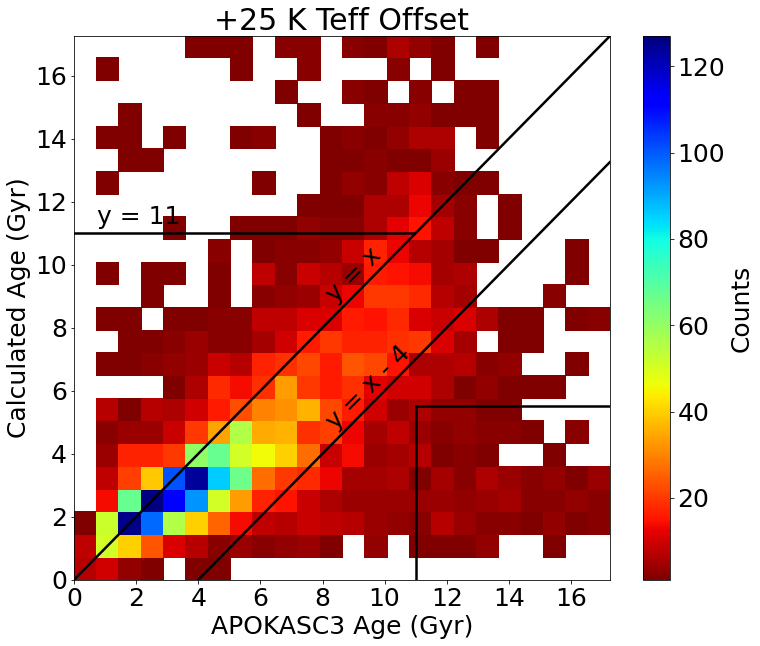

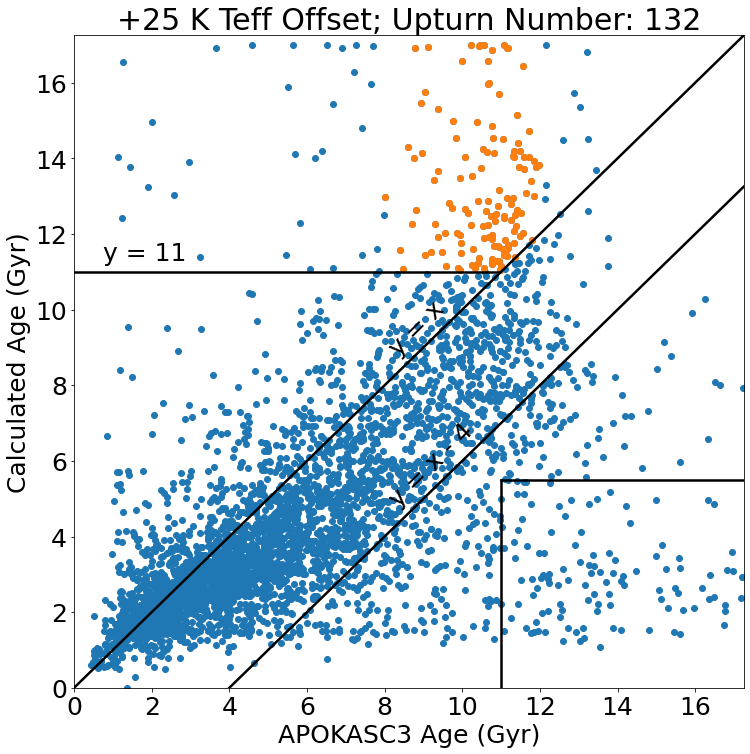

In [83]:
###########
### +25 ###
###########

xmax = 18
ymax = 18
nbins = 25

plt.figure(figsize=[12,10])
plt.hist2d(kasc3['IntAge'][allbad25],ages25['AGE'][allbad25],
           bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)],cmap='jet_r',cmin=1)
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')
plt.title(r'+25 K Teff Offset')

### Scatter

upbox25 = np.where((ages25['AGE'][allbad25]-upturn10Gyr(kasc3['IntAge'][allbad25])>0.0)&
         (kasc3['IntAge'][allbad25]>8.0)&(kasc3['IntAge'][allbad25]<12))

plt.figure(figsize=[12,12])
plt.scatter(kasc3['IntAge'][allbad25],ages25['AGE'][allbad25])
plt.scatter(kasc3['IntAge'][allbad25][upbox25],ages25['AGE'][allbad25][upbox25])
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
# cbar = plt.colorbar()
# cbar.ax.set_ylabel('Counts')
plt.title(r'+25 K Teff Offset')
plt.title(r'+25 K Teff Offset; Upturn Number: {}'.format(len(np.squeeze(upbox25))))
plt.savefig('../plots/age_age_scatter25.pdf',dpi=300,bbox_inches='tight')
plt.show()

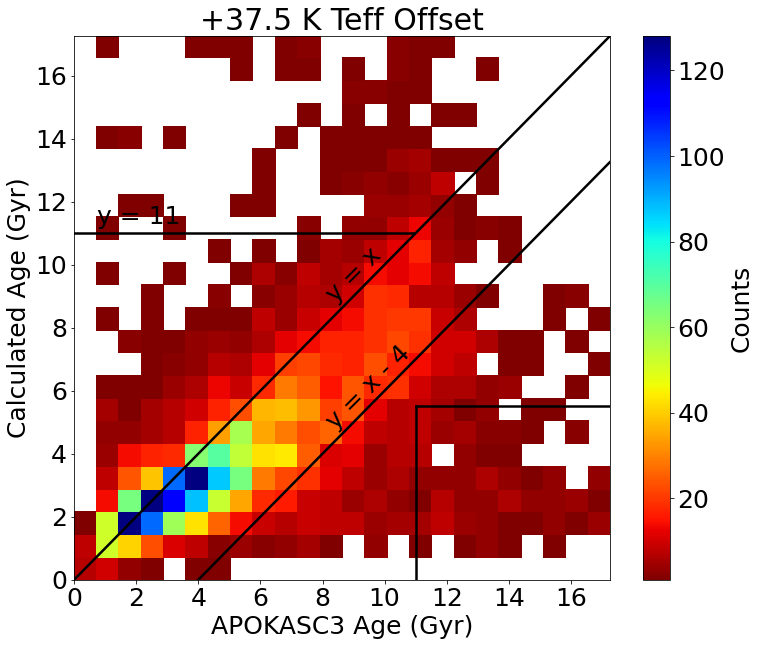

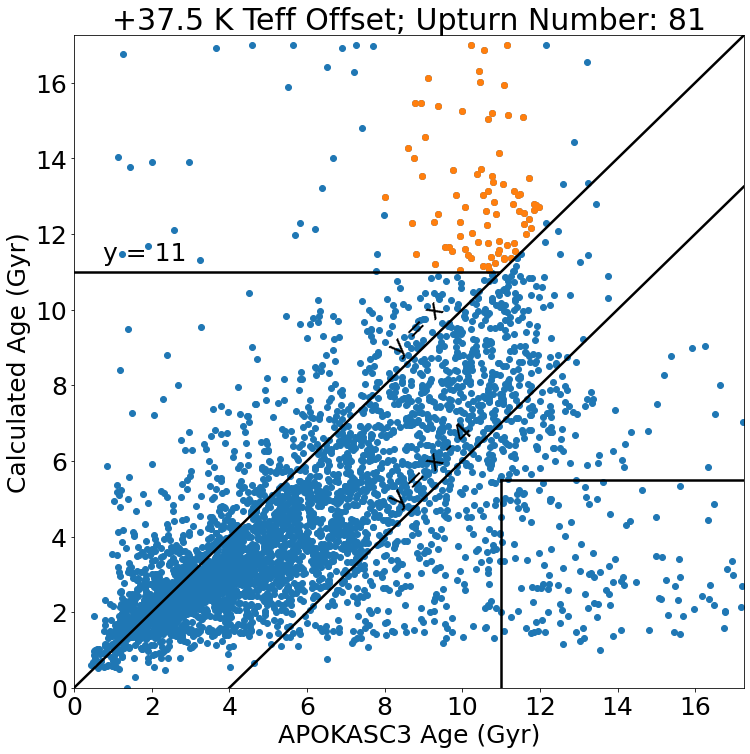

In [84]:
#############
### +37.5 ###
#############

xmax = 18
ymax = 18
nbins = 25

plt.figure(figsize=[12,10])
plt.hist2d(kasc3['IntAge'][allbad375],ages375['AGE'][allbad375],
           bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)],cmap='jet_r',cmin=1)
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')
plt.title(r'+37.5 K Teff Offset')

### Scatter

upbox375 = np.where((ages375['AGE'][allbad375]-upturn10Gyr(kasc3['IntAge'][allbad375])>0.0)&
         (kasc3['IntAge'][allbad375]>8.0)&(kasc3['IntAge'][allbad375]<12))

plt.figure(figsize=[12,12])
plt.scatter(kasc3['IntAge'][allbad375],ages375['AGE'][allbad375])
plt.scatter(kasc3['IntAge'][allbad375][upbox375],ages375['AGE'][allbad375][upbox375])
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
# cbar = plt.colorbar()
# cbar.ax.set_ylabel('Counts')
plt.title(r'+37.5 K Teff Offset')
plt.title(r'+37.5 K Teff Offset; Upturn Number: {}'.format(len(np.squeeze(upbox375))))
plt.savefig('../plots/age_age_scatter375.pdf',dpi=300,bbox_inches='tight')
plt.show()

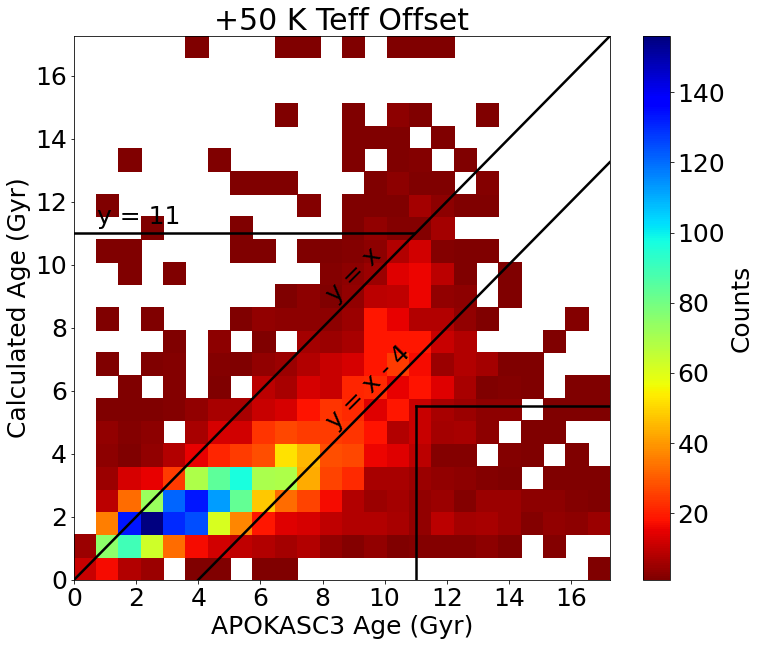

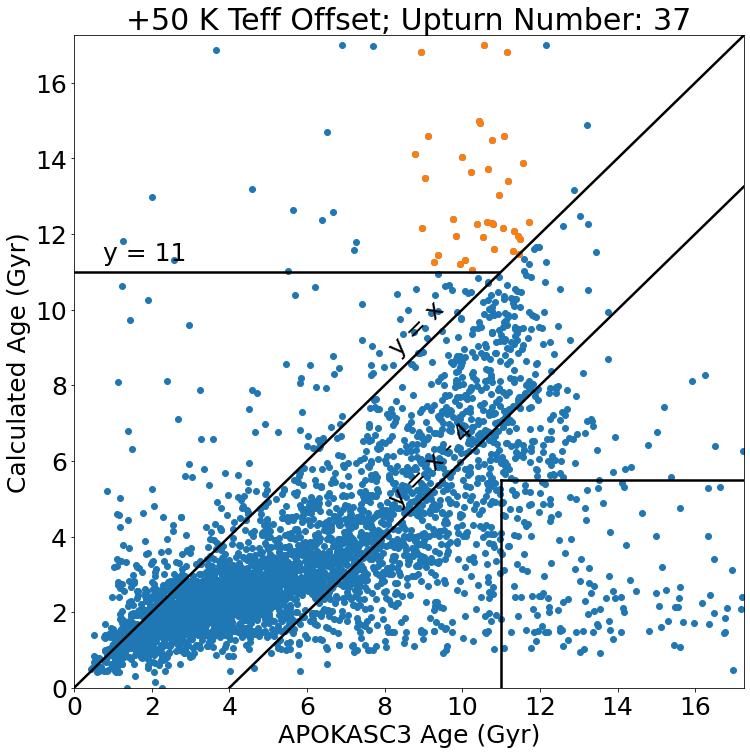

In [95]:
###########
### +50 ###
###########

xmax = 18
ymax = 18
nbins = 25

plt.figure(figsize=[12,10])
plt.hist2d(kasc3['IntAge'][allbad50],ages50['AGE'][allbad50],
           bins=[np.arange(0,xmax,xmax/nbins),np.arange(0,ymax,ymax/25)],cmap='jet_r',cmin=1)
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')
plt.title(r'+50 K Teff Offset')

### Scatter

upbox50 = np.where((ages50['AGE'][allbad50]-upturn10Gyr(kasc3['IntAge'][allbad50])>0.0)&
         (kasc3['IntAge'][allbad50]>8.0)&(kasc3['IntAge'][allbad50]<12))

plt.figure(figsize=[12,12])
plt.scatter(kasc3['IntAge'][allbad50],ages50['AGE'][allbad50])
plt.scatter(kasc3['IntAge'][allbad50][upbox50],ages50['AGE'][allbad50][upbox50])
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
# cbar = plt.colorbar()
# cbar.ax.set_ylabel('Counts')
plt.title(r'+50 K Teff Offset; Upturn Number: {}'.format(len(np.squeeze(upbox50))))
plt.savefig('../plots/age_age_scatter50.pdf',dpi=300,bbox_inches='tight')
plt.show()

Text(0.5, 1.0, '+50 K Teff Offset; Upturn Number: 37')

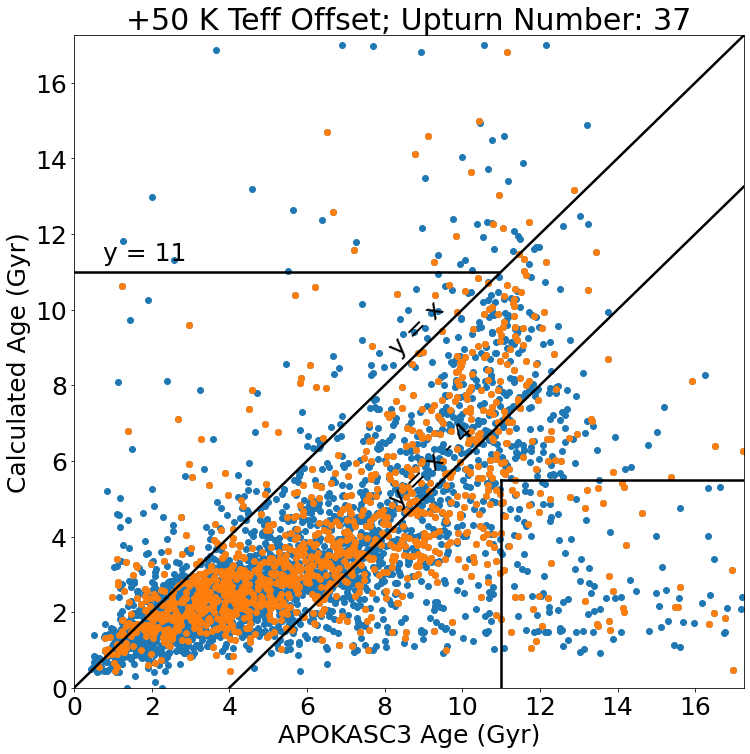

In [97]:
plt.figure(figsize=[12,12])
plt.scatter(kasc3['IntAge'][allbad50],ages50['AGE'][allbad50])
plt.scatter(kasc3['IntAge'][allbad50][hibad50],ages50['AGE'][allbad50][hibad50])
plt.text(8,8.8,'y = x',rotation=45)
plt.text(8,4.8,'y = x - 4',rotation=45)
plt.text(0.75,11.3,'y = 11')

plt.plot([0,18],[0,18],lw=2.5,c='k')
plt.plot([4,17.25],[0,13.25],lw=2.5,c='k')
plt.plot([0,10.95],[11,11],lw=2.5,c='k')

plt.plot([11,11],[0,5.5],c='k',lw=2.5)
plt.plot([11,18],[5.5,5.5],c='k',lw=2.5)

plt.xlim(0,17.25)
plt.ylim(0,17.25)

plt.xticks(np.arange(0,17)[::2],np.arange(0,17)[::2].astype('str'))

plt.xlabel('APOKASC3 Age (Gyr)')
plt.ylabel('Calculated Age (Gyr)')
# cbar = plt.colorbar()
# cbar.ax.set_ylabel('Counts')
plt.title(r'+50 K Teff Offset; Upturn Number: {}'.format(len(np.squeeze(upbox50))))

# Resid Plots

In [151]:
from scipy.stats import binned_statistic

In [143]:
ages_arr = np.array([ages0['AGE'],ages125['AGE'],ages25['AGE'],ages375['AGE'],ages50['AGE']])
lab_arr = ['0 K','12.5 K','25 K','37.5 K','50 K']
fil_arr = ['0K','125K','25K','375K','50K']

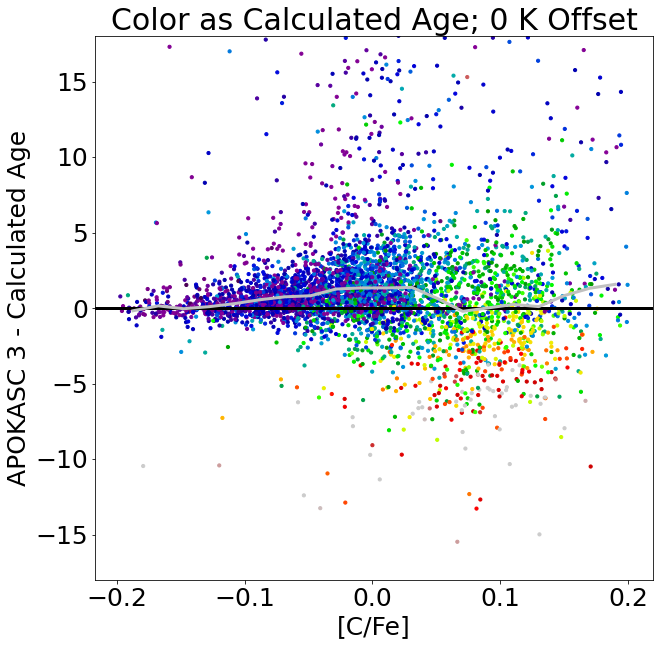

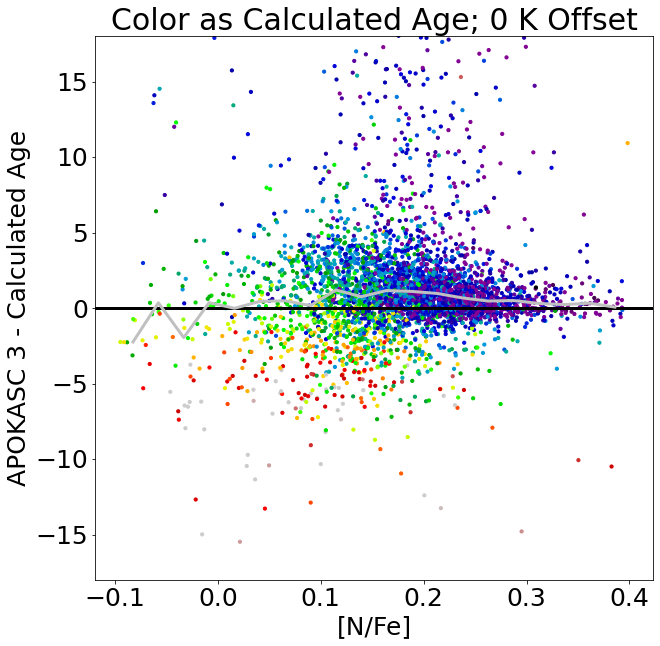

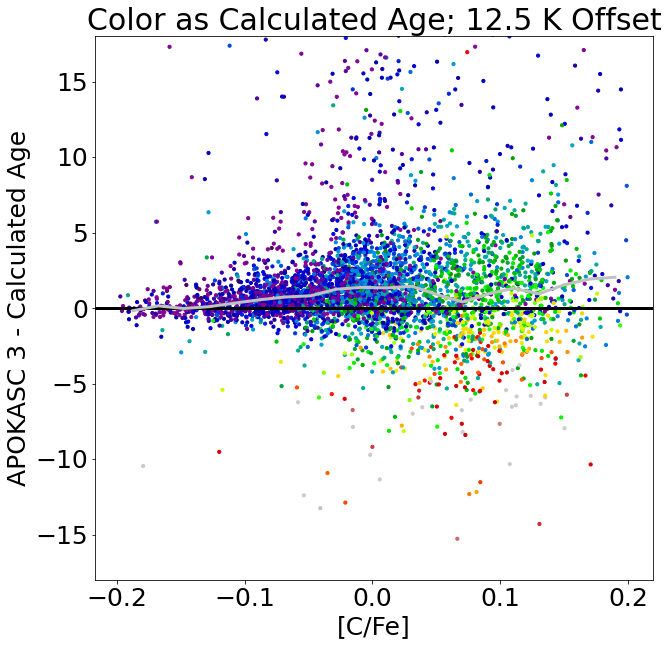

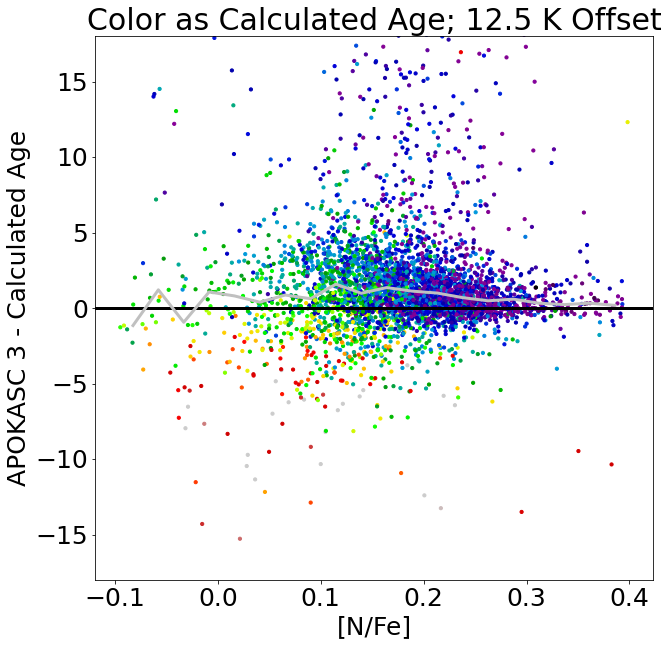

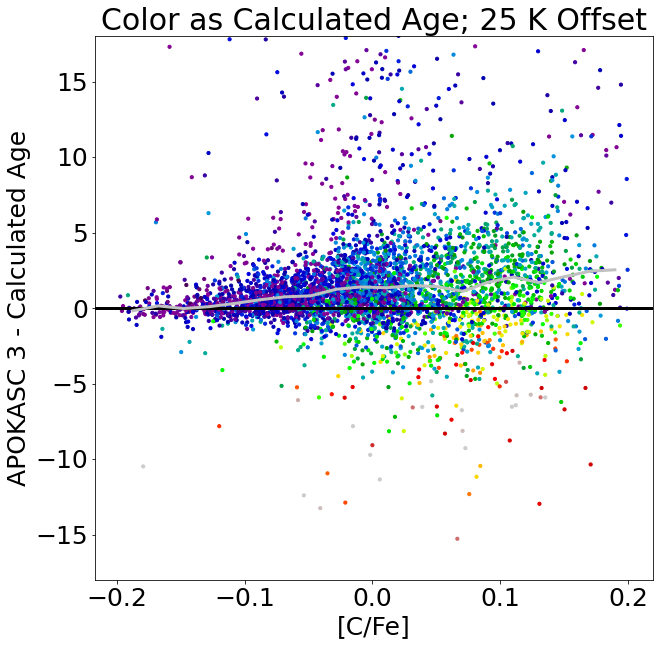

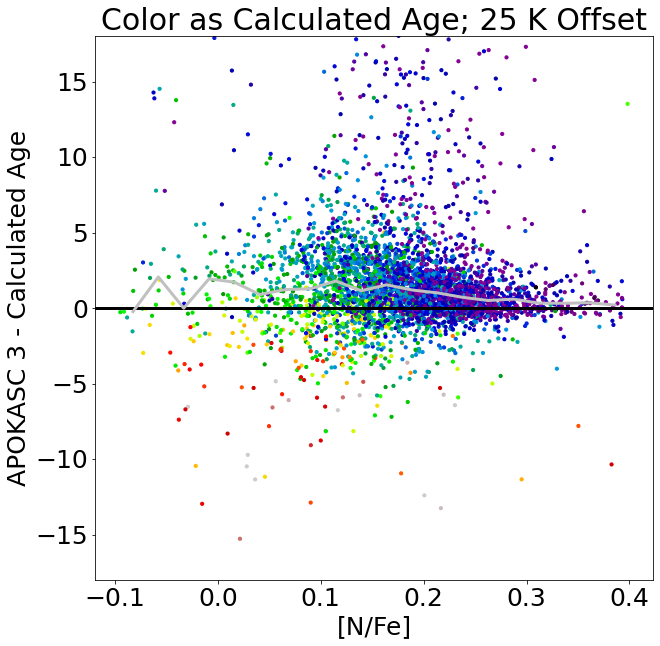

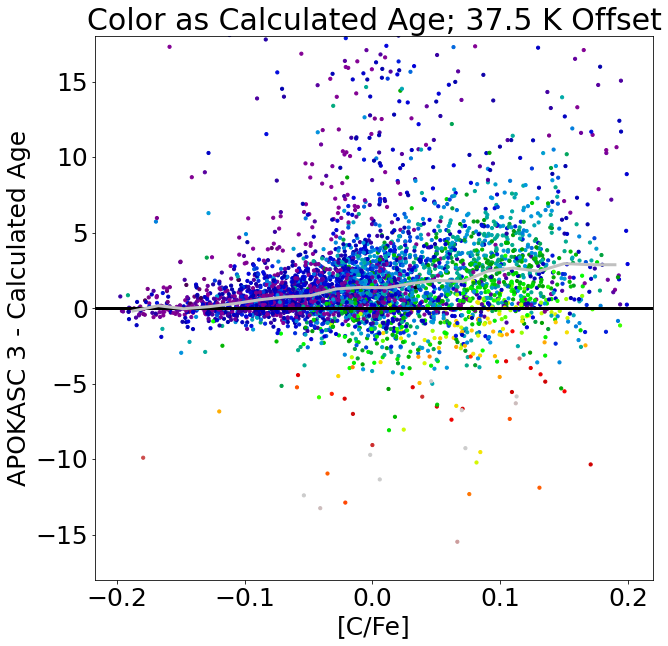

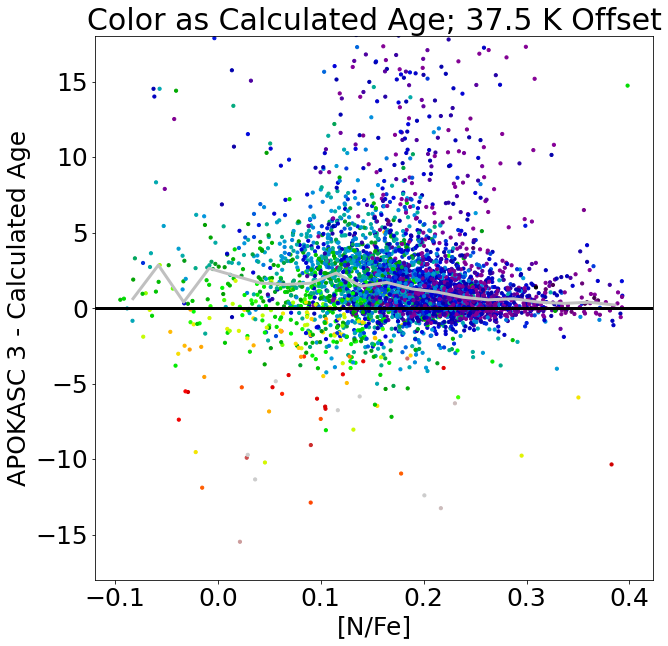

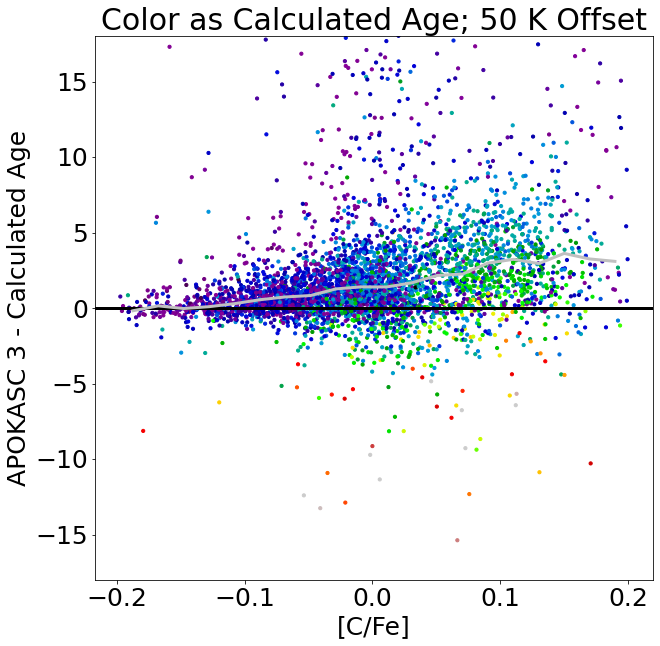

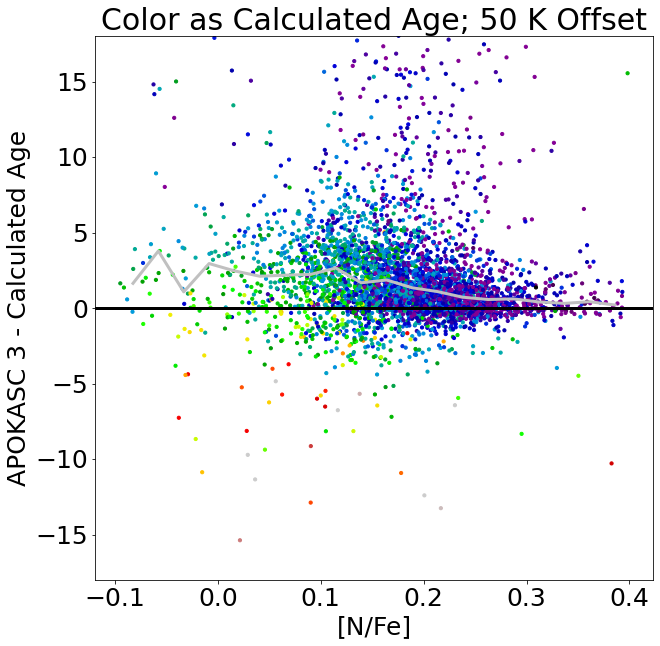

In [195]:
for i in range(len(ages_arr)):
    cln = np.where((ages_arr[i]<20.)&(kasc3dr17['C_FE']>-0.2)&(kasc3dr17['C_FE']<0.2))
    nbins=20
    ### resid C_FE
    cfe_medians,cfe_edges,cfenumber = binned_statistic(kasc3dr17['C_FE'][cln],
                                                       (kasc3['IntAge']-ages_arr[i])[cln],
                                                       statistic='median',bins=nbins)
#     cfe_mads, _, _ = binned_statistic(kasc3dr17['C_FE'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
#                                       statistic=lambda y: np.nanmedian(np.abs(y-np.nanmedian(y))),bins=nbins)
    
    plt.figure(figsize=[10,10])

    plt.scatter(kasc3dr17['C_FE'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
                c=ages_arr[i][cln],cmap='nipy_spectral',s=10)
    
    plt.axhline(0.,c='k',lw=3)
#     plt.hlines(cfe_medians,cfe_edges[:-1],cfe_edges[1:],colors='r',lw=3)
    plt.plot((cfe_edges[:-1]+cfe_edges[1:])/2,cfe_medians,c='silver',lw=3)#,yerr=cfe_mads,c='silver',lw=3)

#     plt.colorbar()

    plt.ylim(-18,18)
#     plt.xlim(-0.3,0.3)

    plt.title(r'Color as Calculated Age; {} Offset'.format(lab_arr[i]))
    plt.xlabel(r'[C/Fe]')
    plt.ylabel(r'APOKASC 3 - Calculated Age')
    plt.savefig('../plots/CFE_resid_calculated{}.pdf'.format(fil_arr[i]),dpi=300,bbox_inches='tight')
    plt.show()

    ### resid N_FE
    cln = np.where((ages_arr[i]<20.)&(kasc3dr17['N_FE']>-0.1)&(kasc3dr17['N_FE']<0.4))
    nfe_medians,nfe_edges,_ = binned_statistic(kasc3dr17['N_FE'][cln],
                                                       (kasc3['IntAge']-ages_arr[i])[cln],
                                               statistic='median',bins=nbins)
#     nfe_mads, _, _ = binned_statistic(kasc3dr17['N_FE'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
#                                       statistic=lambda y: np.nanmedian(np.abs(y-np.nanmedian(y))),bins=nbins)
    
    plt.figure(figsize=[10,10])

    plt.scatter(kasc3dr17['N_FE'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
                c=ages_arr[i][cln],cmap='nipy_spectral',s=10)
    
    plt.axhline(0.,c='k',lw=3)
#     plt.hlines(nfe_medians,nfe_edges[:-1],nfe_edges[1:],colors='r',lw=3)
    plt.plot((nfe_edges[:-1]+nfe_edges[1:])/2,nfe_medians,c='silver',lw=3)#,yerr=nfe_mads,c='silver',lw=3)

#     plt.colorbar()

    plt.ylim(-18,18)
#     plt.xlim(-0.1,0.4)

    plt.title(r'Color as Calculated Age; {} Offset'.format(lab_arr[i]))
    plt.xlabel(r'[N/Fe]')
    plt.ylabel(r'APOKASC 3 - Calculated Age')
    plt.savefig('../plots/NFE_resid_calculated{}.pdf'.format(fil_arr[i]),dpi=300,bbox_inches='tight')
    plt.show()

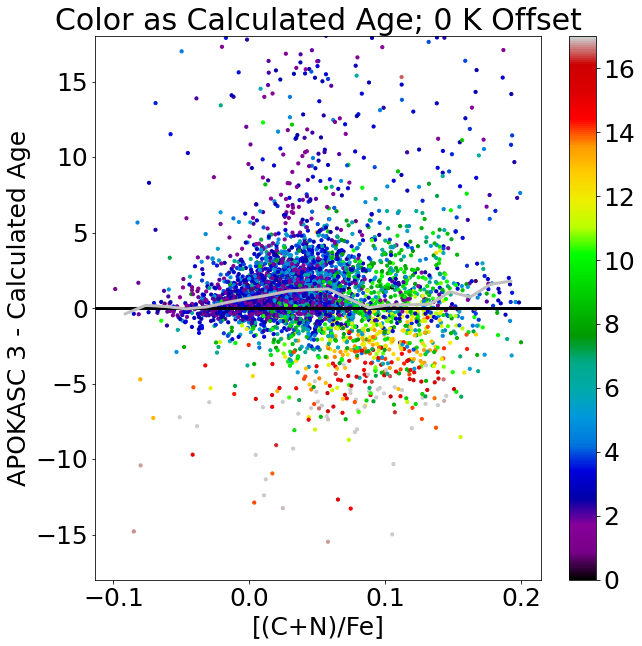

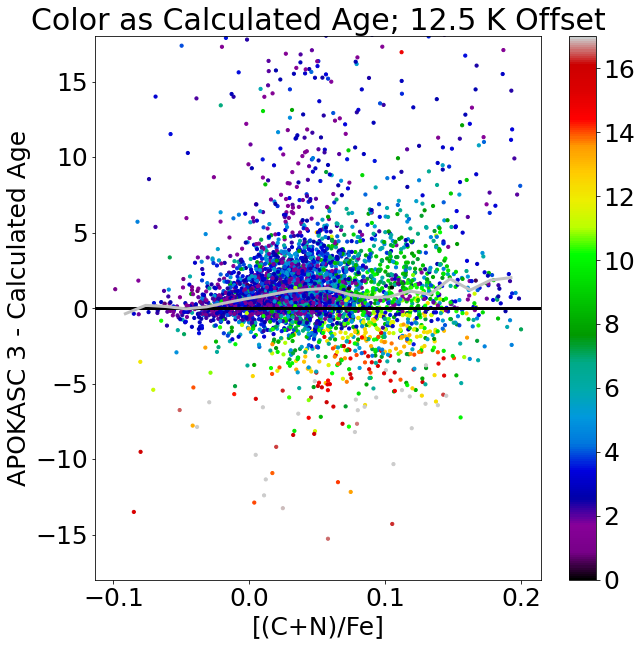

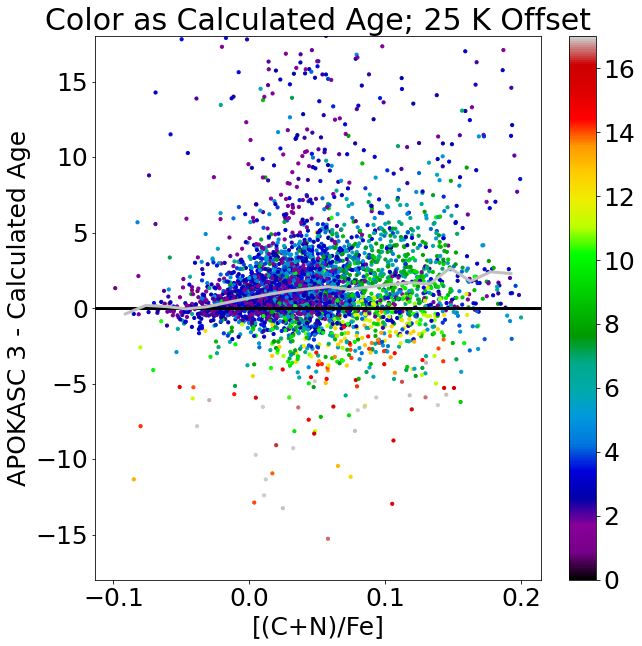

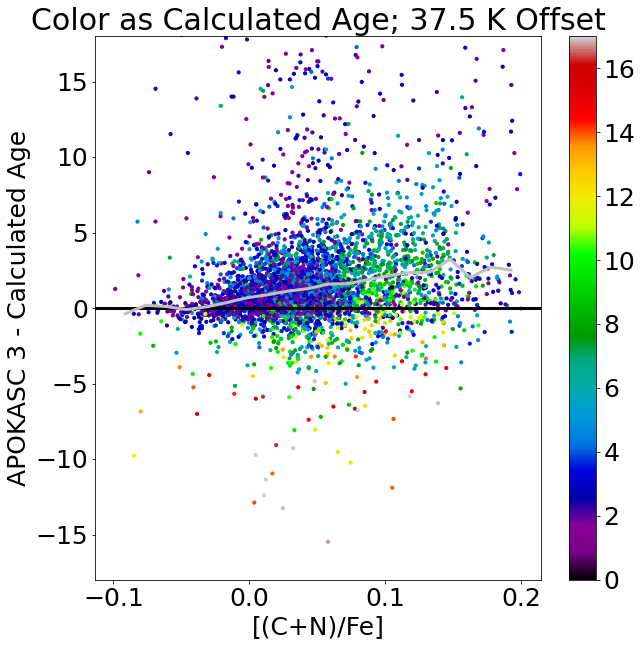

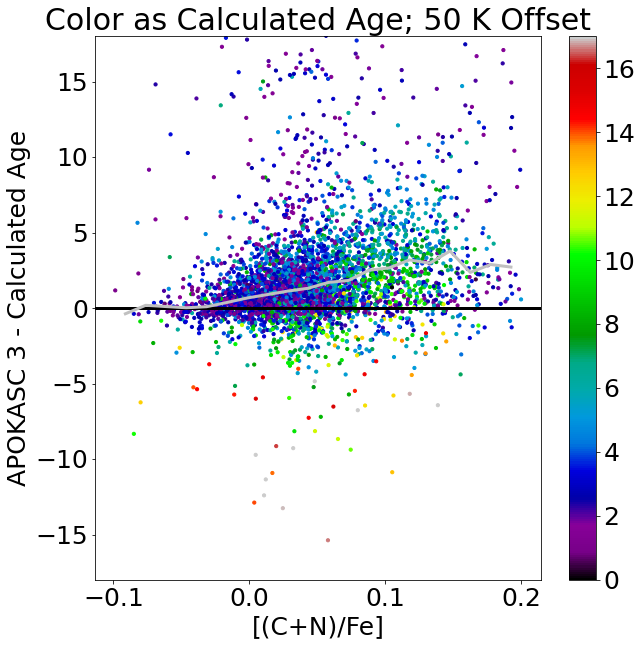

In [196]:
### [(C+N)/Fe]

cfrac = (10**(8.43))/(10**(8.43)+10**(7.83))
nfrac = (10**(7.83))/(10**(8.43)+10**(7.83))

cnfe = np.log10(cfrac*10**(kasc3dr17['C_FE'])+nfrac*10**(kasc3dr17['N_FE']))

for i in range(len(ages_arr)):
    cln = np.where((ages_arr[i]<20.)&(cnfe>-0.1)&(cnfe<0.2))
    nbins=20
    
    cnfe_medians,cnfe_edges,_ = binned_statistic(cnfe[cln],(kasc3['IntAge']-ages_arr[i])[cln],
                                                 statistic='median',bins=nbins)
#     cnfe_mads, _, _ = binned_statistic(cnfe[cln],(kasc3['IntAge']-ages_arr[i])[cln],
#                                       statistic=lambda y: np.nanmedian(np.abs(y-np.nanmedian(y))),bins=nbins)
    
    plt.figure(figsize=[10,10])

    plt.scatter(cnfe[cln],(kasc3['IntAge']-ages_arr[i])[cln],s=10,
                c=ages_arr[i][cln],cmap='nipy_spectral')
    
    plt.axhline(0.,c='k',lw=3)
    plt.plot((cnfe_edges[:-1]+cnfe_edges[1:])/2,cnfe_medians,c='silver',lw=3)#,yerr=cnfe_mads,c='silver',lw=3)

    plt.colorbar()

    plt.ylim(-18,18)
#     plt.xlim(-0.3,0.3)

    plt.title(r'Color as Calculated Age; {} Offset'.format(lab_arr[i]))
    plt.xlabel(r'[(C+N)/Fe]')
    plt.ylabel(r'APOKASC 3 - Calculated Age')
    plt.savefig('../plots/CNFE_resid_calculated{}.pdf'.format(fil_arr[i]),dpi=300,bbox_inches='tight')
    plt.show()

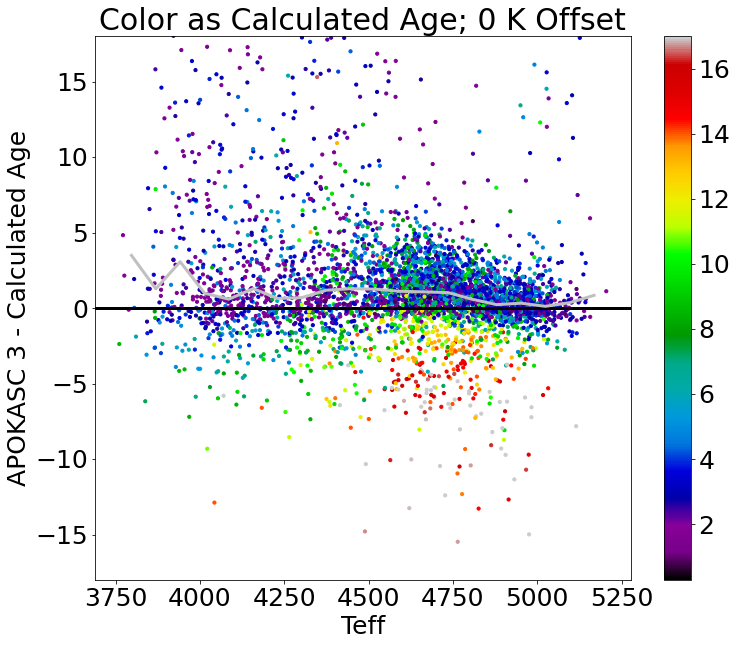

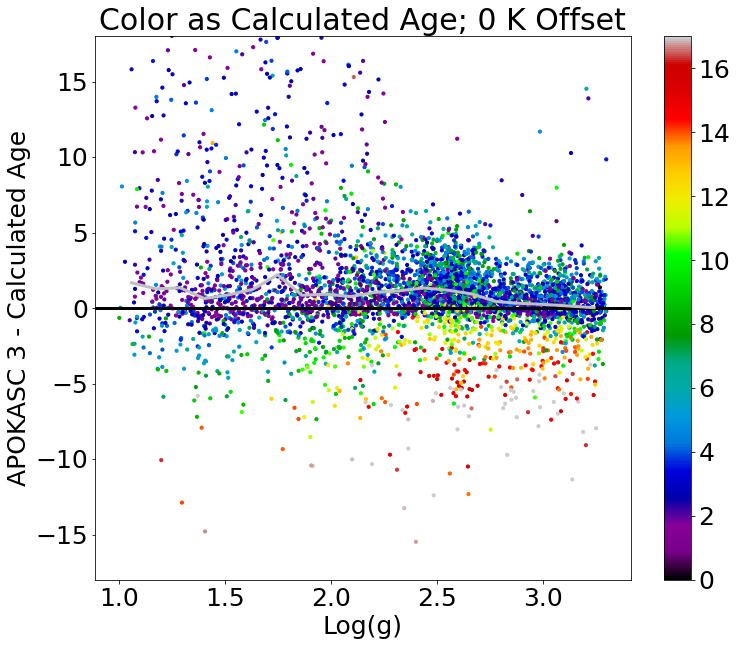

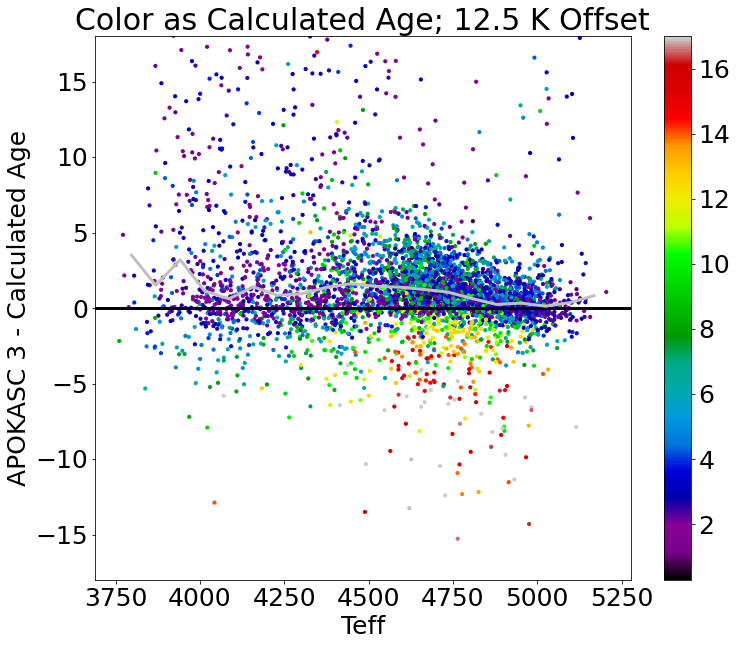

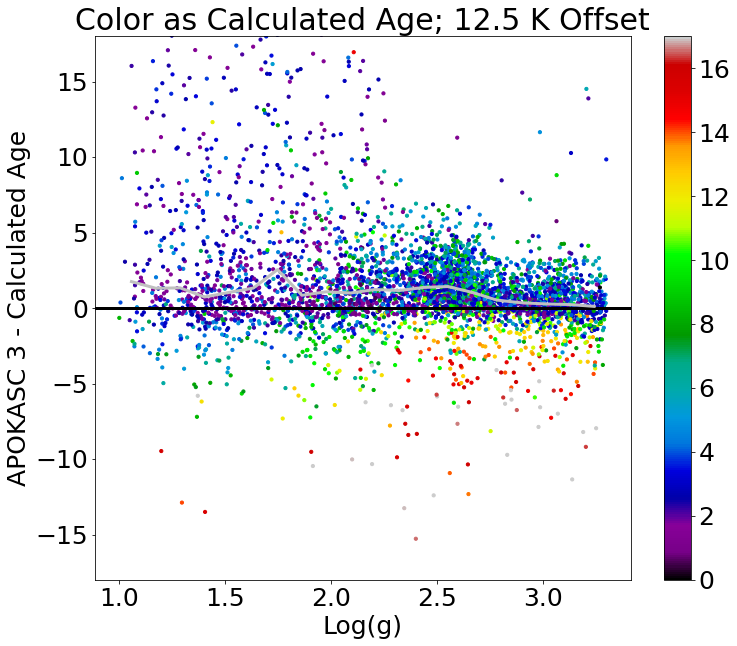

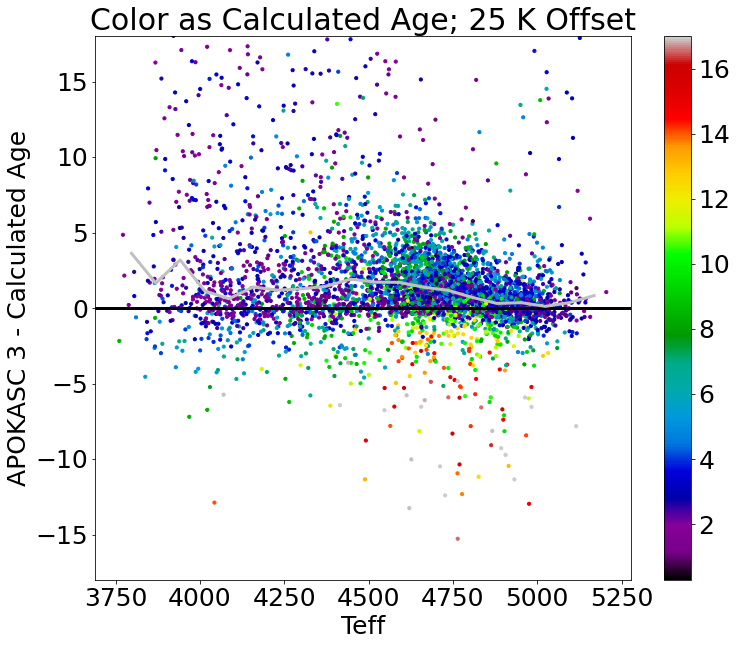

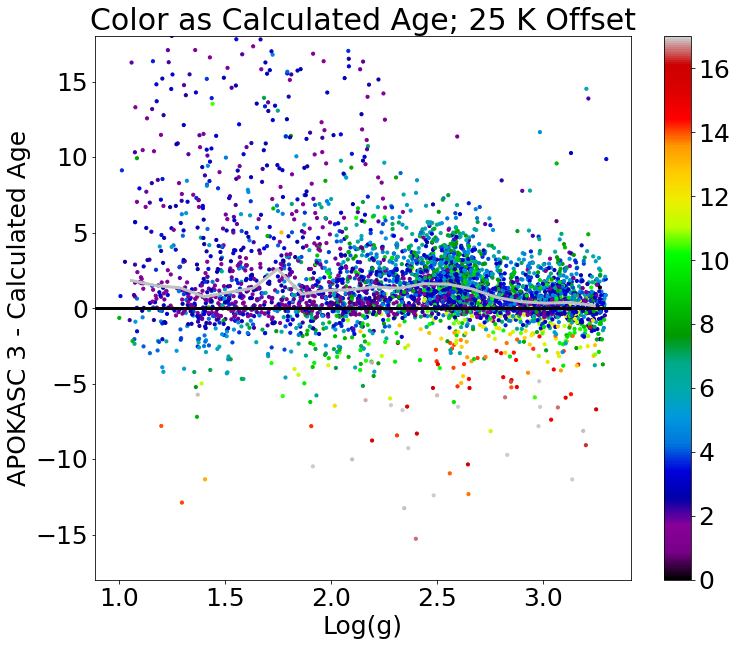

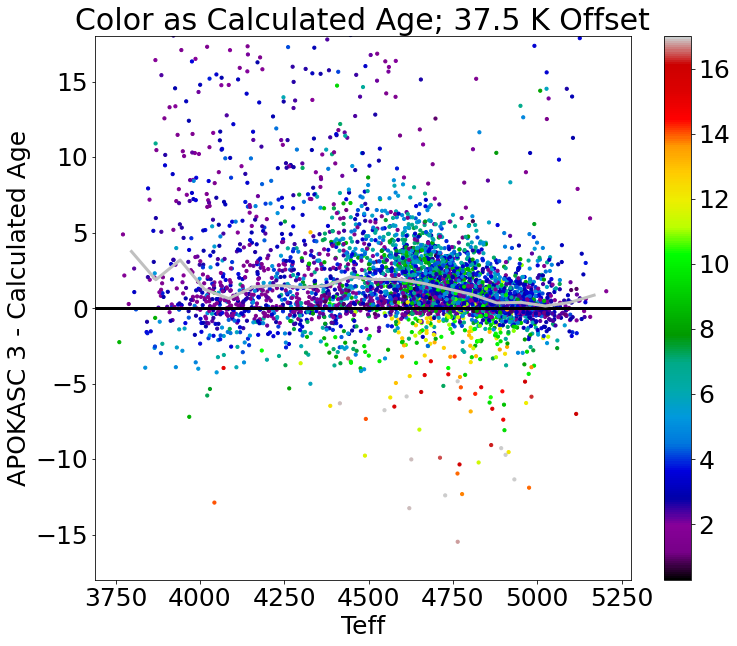

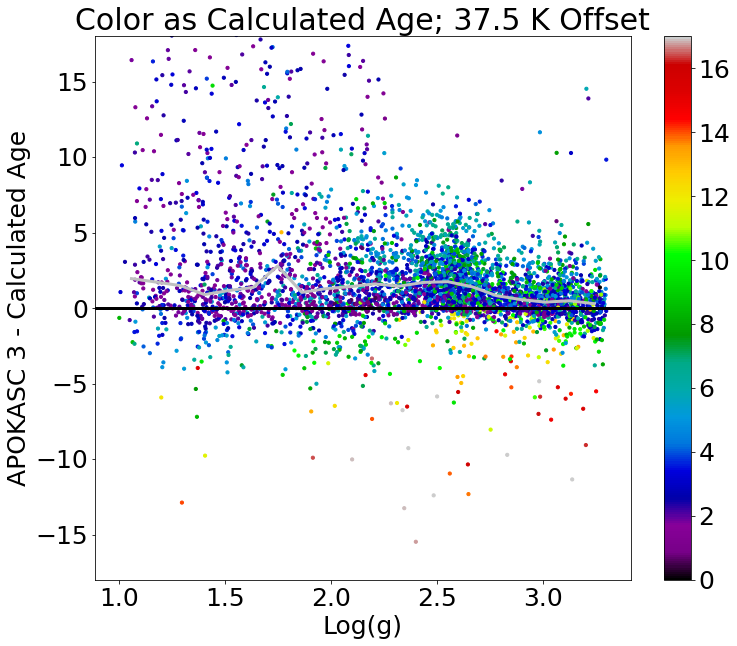

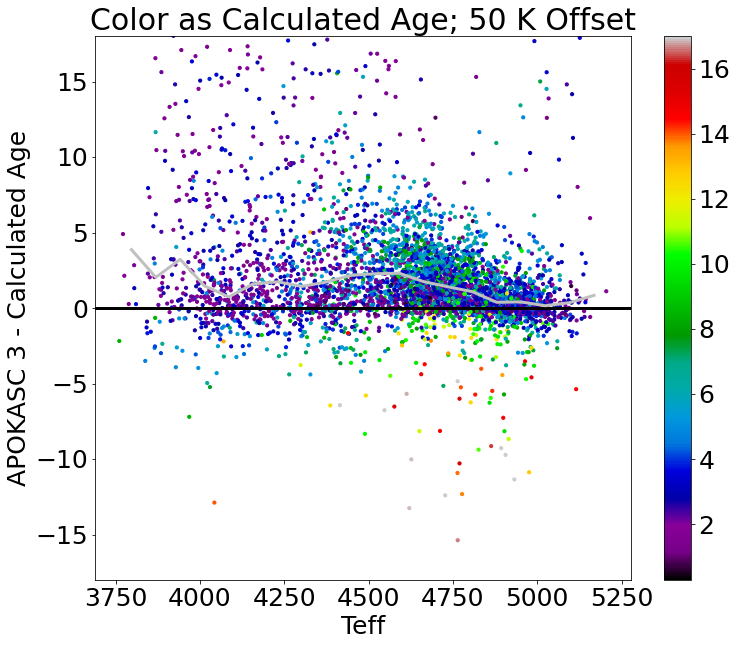

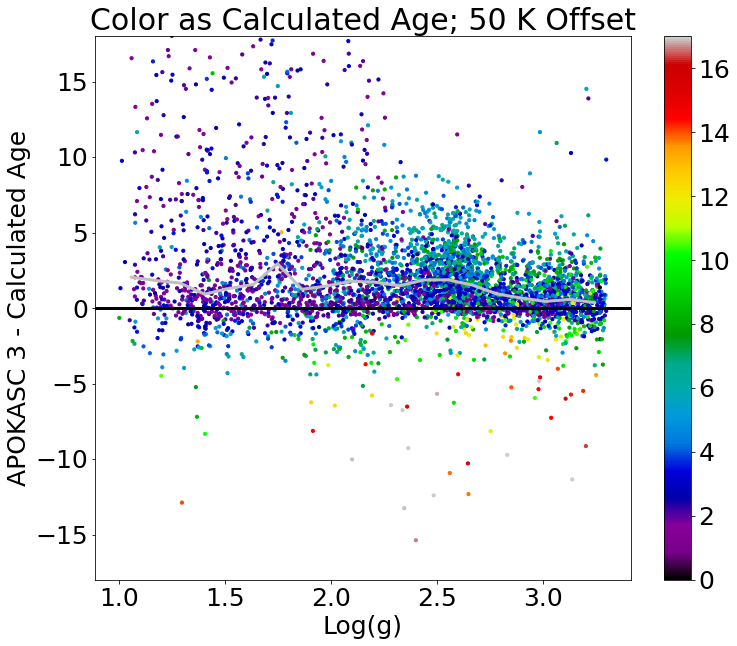

In [197]:
for i in range(len(ages_arr)):
    cln = np.where((ages_arr[i]<20.)&(kasc3dr17['TEFF']>3750)&(kasc3dr17['TEFF']<5250))
    ### resid TEFF
    nbins = 20
    teff_medians,teff_edges,_ = binned_statistic(kasc3dr17['TEFF'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
                                               statistic='median',bins=nbins)
#     teff_mads, _, _ = binned_statistic(kasc3dr17['TEFF'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
#                                       statistic=lambda y: np.nanmedian(np.abs(y-np.nanmedian(y))),bins=nbins)
    
    plt.figure(figsize=[12,10])

    plt.scatter(kasc3dr17['TEFF'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
                c=ages_arr[i][cln],cmap='nipy_spectral',s=10)

    plt.colorbar()
    
    plt.axhline(0.,c='k',lw=3)
#     plt.hlines(teff_medians,teff_edges[:-1],teff_edges[1:],colors='r',lw=3)
    plt.plot((teff_edges[:-1]+teff_edges[1:])/2,teff_medians,c='silver',lw=3)#,yerr=teff_mads,c='silver',lw=3)

    plt.ylim(-18,18)
#     plt.xlim(left=-0.6)

    plt.title(r'Color as Calculated Age; {} Offset'.format(lab_arr[i]))
    plt.xlabel(r'Teff')
    plt.ylabel(r'APOKASC 3 - Calculated Age')
    plt.savefig('../plots/resid_TEFF_calculated{}.pdf'.format(fil_arr[i]),dpi=300,bbox_inches='tight')
    plt.show()

    ### resid LOGG
    cln = np.where((ages_arr[i]<20.)&(kasc3dr17['LOGG']>1)&(kasc3dr17['LOGG']<3.3))
    logg_medians,logg_edges,_ = binned_statistic(kasc3dr17['LOGG'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
                                               statistic='median',bins=nbins)
#     logg_mads, _, _ = binned_statistic(kasc3dr17['LOGG'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
#                                       statistic=lambda y: np.nanmedian(np.abs(y-np.nanmedian(y))),bins=nbins)
    
    plt.figure(figsize=[12,10])

    plt.scatter(kasc3dr17['LOGG'][cln],(kasc3['IntAge']-ages_arr[i])[cln],
                c=ages_arr[i][cln],cmap='nipy_spectral',s=10)

    plt.colorbar()
    
    plt.axhline(0.,c='k',lw=3)
#     plt.hlines(logg_medians,logg_edges[:-1],logg_edges[1:],colors='r',lw=3)
    plt.plot((logg_edges[:-1]+logg_edges[1:])/2,logg_medians,c='silver',lw=3)#,yerr=logg_mads,c='silver',lw=3)

    plt.ylim(-18,18)
#     plt.xlim(left=-0.6)

    plt.title(r'Color as Calculated Age; {} Offset'.format(lab_arr[i]))
    plt.xlabel(r'Log(g)')
    plt.ylabel(r'APOKASC 3 - Calculated Age')
    plt.savefig('../plots/resid_LOGG_calculated{}.pdf'.format(fil_arr[i]),dpi=300,bbox_inches='tight')
    plt.show()